### Abi's code

In [91]:
# filter for clonotypes which have at least count 10 within one cell
from scipy.spatial.distance import pdist, squareform
from scipy.cluster.hierarchy import linkage, dendrogram, leaves_list
from scipy.cluster import hierarchy
import Levenshtein

# within clonotypes
rna_adata = mdata.mod['rna']
dex_adata = mdata.mod['prot']
peptides = dex_adata.var['gene_ids']

# filter for clonotypes (not singletons)
dex_adata_clonotypes = dex_adata[dex_adata.obs['size'] >= 2]
clonotype_binders_list = []
for clonotype in dex_adata_clonotypes.obs['clonotype'].unique().tolist():
    dex_adata_clonotype = dex_adata_clonotypes[dex_adata_clonotypes.obs['clonotype'] == clonotype]
    clonotype_counts = dex_adata_clonotype.X.toarray()
    if np.any(np.any(clonotype_counts > 10, axis=1)):
        clonotype_binders_list.append(clonotype)
# filter dex_adata for these clonotypes
dex_adata_clone_binders = dex_adata[dex_adata.obs['clonotype'].isin(clonotype_binders_list)]
dex_adata_clone_binders
count_matrix = pd.DataFrame(dex_adata_clone_binders.X.toarray(), columns=peptides)
# add cdr3 info
count_matrix['cdr3'] = dex_adata_clone_binders.obs['tra_trb_cdr3'].tolist()
count_matrix
# # filter for cells with count >10 for at least 1 peptide
# count_df = count_matrix.drop("cdr3", axis=1)
# count_df = count_df[count_df.gt(10).any(axis=1)]


# Compute distances and perform hierarchical clustering for rows based on cdr3 sequence

# get levenshtein distance matrix
cdr3_sequences = count_matrix['cdr3']
n = len(cdr3_sequences)
# Initialize a NumPy array for the distance matrix
distance_matrix = np.zeros((n, n), dtype=int)
# Compute the Levenshtein distance for each pair of sequences
for i in range(n):
    for j in range(n):
        distance_matrix[i, j] = Levenshtein.distance(cdr3_sequences[i], cdr3_sequences[j])
# Convert to condensed distance matrix (required by linkage)
condensed_dist_matrix = squareform(distance_matrix)
# Perform hierarchical clustering
row_clusters = hierarchy.linkage(condensed_dist_matrix, method='average')
# Get the row order
row_order = hierarchy.leaves_list(row_clusters)
# Reorder the DataFrame based on clustering results
count_matrix_clustered = count_matrix.iloc[row_order]
count_df_clustered
# Plot heatmap
plt.figure(figsize=(30, 210))
sns.heatmap(count_matrix_clustered.drop("cdr3", axis=1), yticklabels=count_matrix_clustered["cdr3"], cmap='viridis', vmin=0, vmax=30)
plt.show()

NameError: name 'mdata' is not defined

### My code

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import re
import seaborn as sns
import os

from scipy.spatial.distance import pdist, squareform
from scipy.cluster.hierarchy import linkage, dendrogram, leaves_list
from scipy.cluster import hierarchy
#import Levenshtein


Load file names

In [3]:
# Set HLA of interest - change dynamically
hla = 'A*02'
hla_name = hla.replace('*','')

In [9]:
# Generate file names

os.chdir("/Users/ishaharris/Projects/TCR/TCR-Isha/data/Repertoires")

metadata = pd.read_csv("/Users/ishaharris/Projects/TCR/TCR-Isha/data/Repertoires/Cohort01_whole_metadata.tsv", sep="\t") 


metadata_annotat = metadata[metadata['sample_tags'].str.contains(f'HLA-{hla}',case=False, regex = False)]

metadata_annotat = metadata_annotat[metadata_annotat['sample_tags'].str.contains(r'\bcytomegalovirus|CMV\b', case=False, na=False)]
metadata_annotat = metadata_annotat.reset_index(drop=True)

#Extract pos and neg patient IDs
pos_names = metadata_annotat[metadata_annotat['sample_tags'].str.contains(r'\bcytomegalovirus \+|CMV \+\b', case=False, na=False)]
neg_names = metadata_annotat[metadata_annotat['sample_tags'].str.contains(r'\bcytomegalovirus -|CMV -\b', case=False, na=False)]

#Turn into file names
file_names = [name + '.slim.tsv' for name in metadata_annotat['sample_name'].tolist()]
pos_names = [name + '.slim.tsv' for name in pos_names['sample_name'].tolist()]
neg_names = [name + '.slim.tsv' for name in neg_names['sample_name'].tolist()]


metadata_annotat.loc[10,'sample_tags']

print(f'Number of files with CMV and HLA annotation: {len(file_names)}')
print(f'Number of files with CMV +: {len(pos_names)}')
print(f'Number of files with CMV -: {len(neg_names)}')


Number of files with CMV and HLA annotation: 292
Number of files with CMV +: 136
Number of files with CMV -: 156


In [ ]:
# save file names to a pickle, with a specified dir
import pickle
dir = '/Users/ishaharris/Projects/TCR/TCR-Isha/data/Levenshtein distance/pickles'
with open(os.path.join(dir, f'file_names.pkl'), 'wb') as f:
    pickle.dump(file_names, f)


['P00492.slim.tsv',
 'P00412.slim.tsv',
 'P00416.slim.tsv',
 'P00037.slim.tsv',
 'P00346.slim.tsv',
 'P00353.slim.tsv',
 'P00278.slim.tsv',
 'P00260.slim.tsv',
 'P00208.slim.tsv',
 'P00143.slim.tsv',
 'P00085.slim.tsv',
 'P00625.slim.tsv',
 'P00572.slim.tsv',
 'P00496.slim.tsv',
 'P00422.slim.tsv',
 'P00381.slim.tsv',
 'P00570.slim.tsv',
 'P00313.slim.tsv',
 'P00308.slim.tsv',
 'P00568.slim.tsv',
 'P00088.slim.tsv',
 'P00503.slim.tsv',
 'P00205.slim.tsv',
 'P00150.slim.tsv',
 'P00377.slim.tsv',
 'P00311.slim.tsv',
 'P00632.slim.tsv',
 'P00477.slim.tsv',
 'P00419.slim.tsv',
 'P00405.slim.tsv',
 'P00367.slim.tsv',
 'P00360.slim.tsv',
 'P00216.slim.tsv',
 'P00148.slim.tsv',
 'P00086.slim.tsv',
 'P00063.slim.tsv',
 'P00008.slim.tsv',
 'P00296.slim.tsv',
 'P00575.slim.tsv',
 'P00565.slim.tsv',
 'P00312.slim.tsv',
 'P00358.slim.tsv',
 'P00178.slim.tsv',
 'P00177.slim.tsv',
 'P00120.slim.tsv',
 'P00334.slim.tsv',
 'P00336.slim.tsv',
 'P00305.slim.tsv',
 'P00135.slim.tsv',
 'P00161.slim.tsv',


Load data

In [6]:
# Load rep data

rep_file_name = 'P00002.tsv'
rep = pd.read_csv(f'/Volumes/IshaVerbat/Isha/TCR/filtered_for_tcr_dist/{file_name}', sep='\t')
rep = rep.dropna()
rep_seqs = rep.loc[:,'amino_acid'].tolist()
rep_len = len(rep_seqs)

NameError: name 'file_name' is not defined

In [61]:
# Load high conf data

######
highconf_file_name = 'WITHOUT_EBV_highconf.tsv'
#######

highconf = pd.read_csv(f'/Users/ishaharris/Projects/TCR/TCR-Isha/data/High_Confidence_CMV_TCR/{highconf_file_name}', sep='\t')

highconf


,clonotype_id,amino_acid,count,v_call,d_call,j_call
0,AC02_clonotype616,CASGPVDTDTQYF,78.0,TRBV12-5,NaN,TRBJ2-3
1,AC02_clonotype616,CASSSLTYEQYF,78.0,TRBV5-6,NaN,TRBJ2-7
2,AC02_clonotype41,CASSFGEKYGYTF,90.0,TRBV28,NaN,TRBJ1-2
3,AC02_clonotype694,CSVAEMTGATEAFF,71.0,TRBV29-1,TRBD1,TRBJ1-1
4,AC02_clonotype1121,CASSLDGLAGGQGYNEQFF,60.0,TRBV7-3,TRBD2,TRBJ2-1
...,...,...,...,...,...,...
176,AC02_clonotype932,CAWSDGSGEYNEQFF,43.0,TRBV30,NaN,TRBJ2-1
177,AC02_clonotype2472,CASSQEAGQGAYEQYF,89.0,TRBV4-2,TRBD1,TRBJ2-7
178,AC02_clonotype2973,CASSTLGTRTYNEQFF,42.0,TRBV7-8,NaN,TRBJ2-1
179,AC02_clonotype909,CASGSGPLYEQYF,54.0,TRBV28,NaN,TRBJ2-7


In [ ]:
#------------ REMOVED BECAUSE OF NEW PROCESSING DUE TO DOUBLE TRBs
# Add col with just TRB

#highconf_trb = highconf.loc[:, 'cdr3s_aa']
###highconf_trb=highconf_trb.apply(lambda x: re.search(r'TRB:([^;]+)', x).group(1) if 'TRB:' in x else None)
##highconf_seqs = highconf_trb.dropna().unique().tolist()
#highconf_len = len(highconf_seqs)



In [55]:
highconf_seqs = highconf.loc[:,'amino_acid'].tolist()
len(highconf_seqs)

# keep only the uniques
highconf_seqs = list(set(highconf_seqs))

In [33]:
import pickle
dir = '/Users/ishaharris/Projects/TCR/TCR-Isha/data/Levenshtein distance/pickles'
with open(os.path.join(dir, f'highconf_seqs'), 'wb') as f:
    pickle.dump(highconf_seqs, f)

181

Matrix of levenshtein

In [14]:
# Initalise matrix 
distance_matrix = np.zeros((rep_len, highconf_len), dtype=int)
distance_matrix.shape

NameError: name 'rep_len' is not defined

284350

In [16]:
# Function to compute distance for each pair

def compute_leven(file_path, highconf_seqs):
    # Initialise distance matrix
    

    # Read in rep data
    rep = pd.read_csv(f'/Volumes/IshaVerbat/Isha/TCR/filtered_for_tcrdist/{file_path}', sep='\t')
    rep = rep.dropna()
    rep_seqs = rep.loc[:,'amino_acid'].tolist()
    rep_len = len(rep_seqs)
    print(f'Length of rep: {rep_len}')
    highconf_len = len(highconf_seqs)

    distance_matrix = np.zeros((rep_len, highconf_len), dtype=int)

    # Compute distances
    for i, seq_i in enumerate(rep_seqs):
        print(i)
        for j, seq_j in enumerate(highconf_seqs):
            distance_matrix[i,j] = Levenshtein.distance(seq_i, seq_j)
            
    return(distance_matrix)

In [10]:
len(highconf_seqs)

NameError: name 'highconf_seqs' is not defined

In [12]:
# Inspect matrix

unique, counts = np.unique(mat, return_counts=True)
tally = dict(zip(unique,counts)) 

for value, count in tally.items():
    print(f"Value {value}: {count} times")


NameError: name 'mat' is not defined

,patient_id,dist_0,dist_1,dist_2,dist_3,dist_4,dist_5
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...
98448,NaN,NaN,NaN,NaN,NaN,NaN,NaN
98449,NaN,NaN,NaN,NaN,NaN,NaN,NaN
98450,NaN,NaN,NaN,NaN,NaN,NaN,NaN
98451,NaN,NaN,NaN,NaN,NaN,NaN,NaN


['patient_id', 'dist_0', 'dist_1', 'dist_2', 'dist_3', 'dist_4', 'dist_5']

### Calculate absolute Levenshtein distances count

In [ ]:
from rapidfuzz.distance import Levenshtein as L

# Create output path
output_file = '/Users/ishaharris/Projects/TCR/TCR-Isha/data/Processed/leven_output_without_EBV.csv'

# Max distance assignment
max_distance = 5


# Set column names
col_names = ['patient_id'] + [f'dist_{x}' for x in range(6)]

# Load or create the output dataframe
if os.path.exists(output_file):
    dist_df = pd.read_csv(output_file)
    completed_patients = set(dist_df['patient_id'])
else:
    dist_df = pd.DataFrame(columns=col_names)
    completed_patients = set()

# Loop

for idx, file_name in enumerate(file_names): 
    if file_name in completed_patients:
        print(f"Skipping {file_name}, already processed.")
        continue
    
    print(f'Processing ({idx+1}/{len(file_names)}): {file_name}')
    
    # Read and prepare patient's sequence data
    try: 
        rep = pd.read_csv(f'/Volumes/IshaVerbat/Isha/TCR/filtered_for_tcrdist/{file_name}', sep='\t')
        rep = rep.dropna()
        rep_seqs = rep['cdr3_b_aa'].tolist()

    except Exception as e:
        print(f'Error reading {file_name}: {e}')
        continue    


    # Compute distance counts
    counts = np.zeros(max_distance +1, dtype=int)
    for i, seq_i in enumerate(rep_seqs):
        if i % 10000 == 0: 
            print(f"  -> File {file_name}. {i}/{len(rep_seqs)} sequences processed")
        for seq_j in highconf_seqs:
            d = L.distance(seq_i, seq_j)
            if d <= max_distance:
                counts[d] += 1

    # Save result for this patient
    row = {'patient_id': file_name}
    for d in range(max_distance + 1):
        row[f'dist_{d}'] = counts[d]

    dist_df = pd.concat([dist_df, pd.DataFrame([row])], ignore_index=True)

    # Save to disk after every patient
    dist_df.to_csv(output_file, index=False)
    print(f"Saved progress after {file_name}")


    # mat = compute_leven(
    #     file,
    #     highconf_seqs
    # )

    # # Compute counts
    # unique, counts = np.unique(mat, return_counts=True)
    # tally = dict(zip(unique,counts)) 

    # # Output patient_id
    # dist_df.at[idx, 'patient_id'] = file

    # # Add values
    # for d in range(6):
    #     dist_df.at[idx, f'dist_{d}'] = tally.get(d,0)


Processing (1/292): P00492.slim.tsv
  -> File P00492.slim.tsv. 0/279856 sequences processed
  -> File P00492.slim.tsv. 10000/279856 sequences processed
  -> File P00492.slim.tsv. 20000/279856 sequences processed
  -> File P00492.slim.tsv. 30000/279856 sequences processed
  -> File P00492.slim.tsv. 40000/279856 sequences processed
  -> File P00492.slim.tsv. 50000/279856 sequences processed
  -> File P00492.slim.tsv. 60000/279856 sequences processed
  -> File P00492.slim.tsv. 70000/279856 sequences processed
  -> File P00492.slim.tsv. 80000/279856 sequences processed
  -> File P00492.slim.tsv. 90000/279856 sequences processed
  -> File P00492.slim.tsv. 100000/279856 sequences processed
  -> File P00492.slim.tsv. 110000/279856 sequences processed
  -> File P00492.slim.tsv. 120000/279856 sequences processed
  -> File P00492.slim.tsv. 130000/279856 sequences processed
  -> File P00492.slim.tsv. 140000/279856 sequences processed
  -> File P00492.slim.tsv. 150000/279856 sequences processed
  

KeyboardInterrupt: 

In [26]:
dist_df

,patient_id,dist_0,dist_1,dist_2,dist_3,dist_4,dist_5
0,P00492.tsv,63.0,1479.0,19582.0,145241.0,642753.0,1823380.0
1,P00412.tsv,58.0,1260.0,17169.0,129906.0,583541.0,1655819.0
2,P00416.tsv,40.0,1086.0,13695.0,101744.0,457658.0,1336426.0
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...
287,NaN,NaN,NaN,NaN,NaN,NaN,NaN
288,NaN,NaN,NaN,NaN,NaN,NaN,NaN
289,NaN,NaN,NaN,NaN,NaN,NaN,NaN
290,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Logistic regression based on Levenshtein distances

In [44]:
leven_output_path = '/Users/ishaharris/Projects/TCR/TCR-Isha/data/Processed/leven_output.csv'

leven_output = pd.read_csv(leven_output_path)

leven_output

,patient_id,dist_0,dist_1,dist_2,dist_3,dist_4,dist_5,dist_6,dist_7,dist_8,dist_9,dist_10
0,P00492.tsv,63,1479,19582,145241,642753,1823380,NaN,NaN,NaN,NaN,NaN
1,P00412.tsv,58,1260,17169,129906,583541,1655819,NaN,NaN,NaN,NaN,NaN
2,P00416.tsv,40,1086,13695,101744,457658,1336426,NaN,NaN,NaN,NaN,NaN
3,P00037.tsv,52,1330,17539,132783,601336,1756007,NaN,NaN,NaN,NaN,NaN
4,P00346.tsv,23,509,6537,50106,222290,623861,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
287,P00518.tsv,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN
288,P00132.tsv,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN
289,P00471.tsv,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN
290,P00133.tsv,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN


Generate pos and neg file names

In [64]:
# Set HLA of interest - change dynamically
hla = 'A*02'
hla_name = hla.replace('*','')


# Generate file names

os.chdir("/Users/ishaharris/Projects/TCR/TCR-Isha/data/Repertoires")

metadata = pd.read_csv("/Users/ishaharris/Projects/TCR/TCR-Isha/data/Repertoires/Cohort01_whole_metadata.tsv", sep="\t") 


metadata_annotat = metadata[metadata['sample_tags'].str.contains(f'HLA-{hla}',case=False, regex = False)]

metadata_annotat = metadata_annotat[metadata_annotat['sample_tags'].str.contains(r'\bcytomegalovirus|CMV\b', case=False, na=False)]
metadata_annotat = metadata_annotat.reset_index(drop=True)

#Extract pos and neg patient IDs
pos_names = metadata_annotat[metadata_annotat['sample_tags'].str.contains(r'\bcytomegalovirus \+|CMV \+\b', case=False, na=False)]
neg_names = metadata_annotat[metadata_annotat['sample_tags'].str.contains(r'\bcytomegalovirus -|CMV -\b', case=False, na=False)]

#Turn into file names
file_names = [name + '.tsv' for name in metadata_annotat['sample_name'].tolist()]
pos_names = [name + '.tsv' for name in pos_names['sample_name'].tolist()]
neg_names = [name + '.tsv' for name in neg_names['sample_name'].tolist()]


metadata_annotat.loc[10,'sample_tags']

print(f'Number of files with CMV and HLA annotation: {len(file_names)}')
print(f'Number of files with CMV +: {len(pos_names)}')
print(f'Number of files with CMV -: {len(neg_names)}')


Number of files with CMV and HLA annotation: 292
Number of files with CMV +: 136
Number of files with CMV -: 156


Clean and annotate data

In [46]:
# remove empty cols
leven_output
dist_cols = [c for c in leven_output.columns if c.startswith('dist_')]
cols_to_drop = [c for c in dist_cols if leven_output[c].isna().all()]
leven_output = leven_output.drop(columns=cols_to_drop)

In [47]:
## Add CMV status
leven_output['cmv_status'] = np.where(
    leven_output['patient_id'].isin(pos_names),
    'Positive',
    np.where(leven_output['patient_id'].isin(neg_names), 'Negative', 'unknown')
)

leven_output

,patient_id,dist_0,dist_1,dist_2,dist_3,dist_4,dist_5,cmv_status
0,P00492.tsv,63,1479,19582,145241,642753,1823380,Positive
1,P00412.tsv,58,1260,17169,129906,583541,1655819,Positive
2,P00416.tsv,40,1086,13695,101744,457658,1336426,Negative
3,P00037.tsv,52,1330,17539,132783,601336,1756007,Negative
4,P00346.tsv,23,509,6537,50106,222290,623861,Positive
...,...,...,...,...,...,...,...,...
287,P00518.tsv,0,0,0,0,0,0,Positive
288,P00132.tsv,0,0,0,0,0,0,Negative
289,P00471.tsv,0,0,0,0,0,0,Negative
290,P00133.tsv,0,0,0,0,0,0,Negative


In [49]:
import os
import pandas as pd

base_dir = '/Volumes/IshaVerbat/Isha/TCR/All_Emerson_Filtered'

def get_rep_len(fn):
    print(fn)
    path = os.path.join(base_dir, fn)
    try:
        rep = pd.read_csv(path, sep='\t')
    except FileNotFoundError:
        return pd.NA

    rep = rep.dropna(subset=['amino_acid'])
    print(f'Repertoire length: {len(rep)}')
    mat_size = len(highconf_seqs) * len(rep)
    print(f'Matrix size: {mat_size}')
    
    return mat_size

leven_output['rep_len'] = leven_output['patient_id'].apply(get_rep_len)

# Save updated DataFrame
leven_output.to_csv("leven_output_with_replen.csv", index=False)


P00492.tsv
Repertoire length: 284350
Matrix size: 51751700
P00412.tsv
Repertoire length: 275960
Matrix size: 50224720
P00416.tsv
Repertoire length: 212178
Matrix size: 38616396
P00037.tsv
Repertoire length: 267756
Matrix size: 48731592
P00346.tsv
Repertoire length: 103760
Matrix size: 18884320
P00353.tsv
Repertoire length: 173271
Matrix size: 31535322
P00278.tsv
Repertoire length: 197888
Matrix size: 36015616
P00260.tsv
Repertoire length: 116603
Matrix size: 21221746
P00208.tsv
Repertoire length: 147490
Matrix size: 26843180
P00143.tsv
Repertoire length: 173861
Matrix size: 31642702
P00085.tsv
Repertoire length: 51217
Matrix size: 9321494
P00625.tsv
Repertoire length: 107008
Matrix size: 19475456
P00572.tsv
Repertoire length: 11177
Matrix size: 2034214
P00496.tsv
Repertoire length: 24499
Matrix size: 4458818
P00422.tsv
Repertoire length: 267623
Matrix size: 48707386
P00381.tsv
Repertoire length: 117990
Matrix size: 21474180
P00570.tsv
Repertoire length: 131414
Matrix size: 23917348
P00

In [83]:

leven_output

,patient_id,dist_0,dist_1,dist_2,dist_3,dist_4,dist_5,cmv_status
0,P00492.tsv,63,1479,19582,145241,642753,1823380,Positive
1,P00412.tsv,58,1260,17169,129906,583541,1655819,Positive
2,P00416.tsv,40,1086,13695,101744,457658,1336426,Negative
3,P00037.tsv,52,1330,17539,132783,601336,1756007,Negative
4,P00346.tsv,23,509,6537,50106,222290,623861,Positive
...,...,...,...,...,...,...,...,...
287,P00518.tsv,0,0,0,0,0,0,Positive
288,P00132.tsv,0,0,0,0,0,0,Negative
289,P00471.tsv,0,0,0,0,0,0,Negative
290,P00133.tsv,0,0,0,0,0,0,Negative


In [94]:
## Clean up!
lo = pd.read_csv("/Users/ishaharris/Projects/TCR/TCR-Isha/data/Processed/leven_output_with_replen.csv")
lo = lo.drop(columns=['mat_size.1'])
lo['rep_len'] = lo['mat_size']/len(highconf_seqs)
lo
lo.to_csv("/Users/ishaharris/Projects/TCR/TCR-Isha/data/Processed/leven_output_with_replen.csv", index=False)

KeyError: "['mat_size.1'] not found in axis"

In [96]:
lo = pd.read_csv("/Users/ishaharris/Projects/TCR/TCR-Isha/data/Processed/leven_output_with_replen.csv")
lo

,patient_id,dist_0,dist_1,dist_2,dist_3,dist_4,dist_5,cmv_status,mat_size,rep_len
0,P00492.tsv,63,1479,19582,145241,642753,1823380,Positive,51751700,284350.0
1,P00412.tsv,58,1260,17169,129906,583541,1655819,Positive,50224720,275960.0
2,P00416.tsv,40,1086,13695,101744,457658,1336426,Negative,38616396,212178.0
3,P00037.tsv,52,1330,17539,132783,601336,1756007,Negative,48731592,267756.0
4,P00346.tsv,23,509,6537,50106,222290,623861,Positive,18884320,103760.0
...,...,...,...,...,...,...,...,...,...,...
287,P00518.tsv,0,0,0,0,0,0,Positive,34338122,188671.0
288,P00132.tsv,0,0,0,0,0,0,Negative,26179062,143841.0
289,P00471.tsv,0,0,0,0,0,0,Negative,12683216,69688.0
290,P00133.tsv,0,0,0,0,0,0,Negative,23481094,129017.0


In [50]:


# 1) compute cumulative dist_0–3 and turn into a proportion of rep_len
leven_output['cum_prop_0_1'] = (
    leven_output[['dist_0','dist_1']]
      .sum(axis=1)         # sum dist_0 through dist_3 for each row
    / leven_output['rep_len']         # divide by rep_len
)

# 2) pull out only the columns you asked for
new_df = leven_output[['patient_id','cum_prop_0_1','cmv_status']].copy()


lo = leven_output.copy()

lo.tail(50)


,patient_id,dist_0,dist_1,dist_2,dist_3,dist_4,dist_5,cmv_status,rep_len,cum_prop_0_1
242,P00304.tsv,53,1423,19335,142847,641910,1844306,Positive,55021694,0.000027
243,P00287.tsv,31,897,12444,92205,409097,1172643,Negative,38345398,0.000024
244,P00656.tsv,56,1020,14062,104375,465947,1342569,Negative,38452414,0.000028
245,P00357.tsv,39,1059,14820,110524,503285,1470552,Negative,41648880,0.000026
246,P00525.tsv,21,733,10313,79203,366495,1090745,Positive,31455970,0.000024
247,P00343.tsv,18,563,7688,57955,259175,741854,Positive,22148126,0.000026
248,P00665.tsv,15,230,3319,24927,110880,323009,Negative,9716798,0.000025
249,P00502.tsv,38,864,11290,84141,372239,1044271,Negative,30968392,0.000029
250,P00527.tsv,35,670,7843,58288,258440,736442,Positive,21491288,0.000033
251,P00609.tsv,34,731,8722,66696,305913,903814,Negative,27355874,0.000028


Remove failed analyses

In [56]:
columns_to_check = [f'dist_{n}' for n in range(5)]
zero_rows = (lo[columns_to_check] == 0).all(axis=1)
zero_row_count = zero_rows.sum()

lo_no_zero = lo[~zero_rows]


In [58]:
lo = lo_no_zero

In [103]:
lo

,patient_id,dist_0,dist_1,dist_2,dist_3,dist_4,dist_5,cmv_status,mat_size,rep_len
0,P00492.tsv,63,1479,19582,145241,642753,1823380,Positive,51751700,284350.0
1,P00412.tsv,58,1260,17169,129906,583541,1655819,Positive,50224720,275960.0
2,P00416.tsv,40,1086,13695,101744,457658,1336426,Negative,38616396,212178.0
3,P00037.tsv,52,1330,17539,132783,601336,1756007,Negative,48731592,267756.0
4,P00346.tsv,23,509,6537,50106,222290,623861,Positive,18884320,103760.0
...,...,...,...,...,...,...,...,...,...,...
287,P00518.tsv,0,0,0,0,0,0,Positive,34338122,188671.0
288,P00132.tsv,0,0,0,0,0,0,Negative,26179062,143841.0
289,P00471.tsv,0,0,0,0,0,0,Negative,12683216,69688.0
290,P00133.tsv,0,0,0,0,0,0,Negative,23481094,129017.0


   patient_id  dist_0  dist_1  dist_2  dist_3  dist_4   dist_5 cmv_status  \
0  P00492.tsv      63    1479   19582  145241  642753  1823380   Positive   
1  P00412.tsv      58    1260   17169  129906  583541  1655819   Positive   
2  P00416.tsv      40    1086   13695  101744  457658  1336426   Negative   
3  P00037.tsv      52    1330   17539  132783  601336  1756007   Negative   
4  P00346.tsv      23     509    6537   50106  222290   623861   Positive   

   mat_size   rep_len  cum_prop_0_1  cum_prop_0_2  cum_prop_0_3  cum_prop_0_4  \
0  51751700  284350.0      0.005423      0.074289      0.585071      2.845500   
1  50224720  275960.0      0.004776      0.066992      0.537734      2.652319   
2  38616396  212178.0      0.005307      0.069852      0.549374      2.706327   
3  48731592  267756.0      0.005161      0.070665      0.566576      2.812411   
4  18884320  103760.0      0.005127      0.068128      0.551031      2.693379   

   cum_prop_0_5  
0      9.257950  
1      8.65253

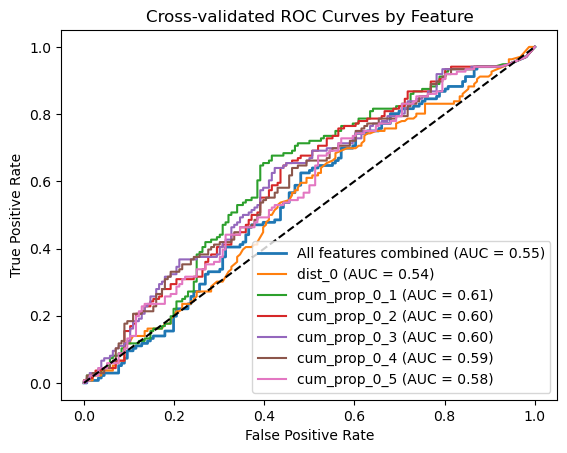

In [106]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedKFold, cross_val_predict, train_test_split
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
import matplotlib.pyplot as plt
import numpy as np

# Toggle: set to True for cross-validation, False for train-test split
use_cross_val = True

# 1. Feature engineering
lo['cum_prop_0_1'] = (lo['dist_0'] + lo['dist_1']) / lo['rep_len']
lo['cum_prop_0_2'] = (lo['dist_0'] + lo['dist_1'] + lo['dist_2']) / lo['rep_len']
lo['cum_prop_0_3'] = (lo['dist_0'] + lo['dist_1'] + lo['dist_2'] + lo['dist_3']) / lo['rep_len']
lo['cum_prop_0_4'] = (lo['dist_0'] + lo['dist_1'] + lo['dist_2'] + lo['dist_3'] + lo['dist_4']) / lo['rep_len']
lo['cum_prop_0_5'] = (lo['dist_0'] + lo['dist_1'] + lo['dist_2'] + lo['dist_3'] + lo['dist_4'] + lo['dist_5']) / lo['rep_len']

print(lo.head())

# 2. Filter to binary classes and encode
lo_bin = lo[lo['cmv_status'].isin(['Positive', 'Negative'])].copy()
lo_bin['y'] = np.where(lo_bin['cmv_status'] == 'Positive', 1, 0)

# 3. Define features and labels
individual_features = ['dist_0', 'cum_prop_0_1', 'cum_prop_0_2', 'cum_prop_0_3', 'cum_prop_0_4', 'cum_prop_0_5']
X = lo_bin[individual_features]
y = lo_bin['y']

# 4. Prepare CV or train/test split
if use_cross_val:
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    split_method = lambda model, X, y: cross_val_predict(model, X, y, cv=cv, method='predict_proba')[:, 1]
else:
    X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.3, random_state=42)
    def split_method(model, X, y):
        model.fit(X_train[X.columns], y_train)
        return model.predict_proba(X_test[X.columns])[:, 1]

# 5. Plot ROC for all features combined
pipeline_all = make_pipeline(StandardScaler(), LogisticRegression(solver='liblinear'))
y_proba_all = split_method(pipeline_all, X, y)
if use_cross_val:
    fpr_all, tpr_all, _ = roc_curve(y, y_proba_all)
    auc_all = roc_auc_score(y, y_proba_all)
else:
    fpr_all, tpr_all, _ = roc_curve(y_test, y_proba_all)
    auc_all = roc_auc_score(y_test, y_proba_all)

plt.figure()
plt.plot(fpr_all, tpr_all, label=f"All features combined (AUC = {auc_all:.2f})", linewidth=2)

# 6. Plot ROC for each individual feature
for feat in individual_features:
    Xi = lo_bin[[feat]]
    pipeline_feat = make_pipeline(StandardScaler(), LogisticRegression(solver='liblinear'))
    if use_cross_val:
        y_proba_feat = cross_val_predict(pipeline_feat, Xi, y, cv=cv, method='predict_proba')[:, 1]
        fpr, tpr, _ = roc_curve(y, y_proba_feat)
        auc_feat = roc_auc_score(y, y_proba_feat)
    else:
        Xi_train, Xi_test = X_train[[feat]], X_test[[feat]]
        pipeline_feat.fit(Xi_train, y_train)
        y_proba_feat = pipeline_feat.predict_proba(Xi_test)[:, 1]
        fpr, tpr, _ = roc_curve(y_test, y_proba_feat)
        auc_feat = roc_auc_score(y_test, y_proba_feat)

    plt.plot(fpr, tpr, label=f"{feat} (AUC = {auc_feat:.2f})")

# 7. Finalise plot
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
title = "Cross-validated" if use_cross_val else "Train/test split"
plt.title(f"{title} ROC Curves by Feature")
plt.legend()
plt.show()



Is there a correlation between repertoire size and CMV status?

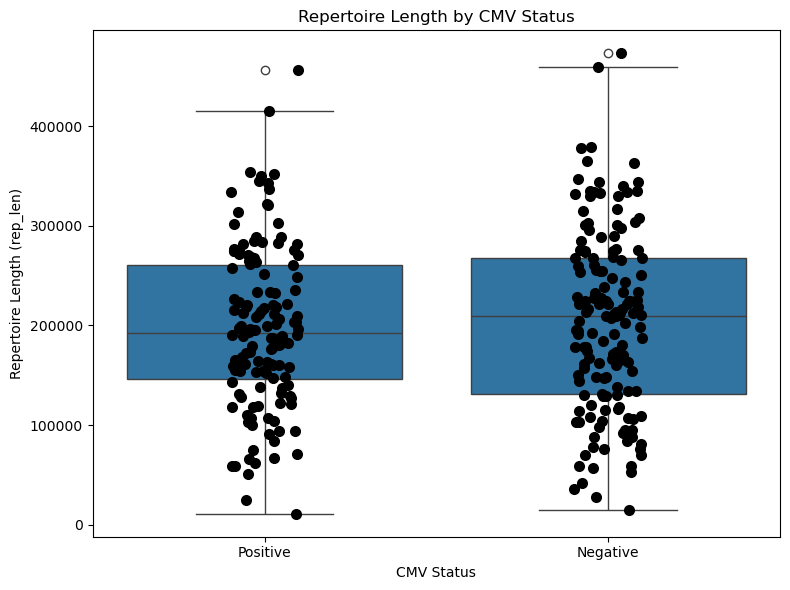

In [100]:
plt.figure(figsize=(8, 6))
sns.boxplot(x="cmv_status", y="rep_len", data=lo)
sns.stripplot(x="cmv_status", y="rep_len", data=lo, color="black", size=8, jitter=True)

plt.title("Repertoire Length by CMV Status")
plt.xlabel("CMV Status")
plt.ylabel("Repertoire Length (rep_len)")
plt.tight_layout()
plt.show()

In [102]:
# Mean repertoire length
mean_rep_len = lo.groupby('cmv_status')['rep_len'].mean()
mean_rep_len

cmv_status
Negative    202943.833333
Positive    197687.316176
Name: rep_len, dtype: float64

NameError: name 'highconf_seqs' is not defined

### Compute Levenshtein distance with frequency information 

In [17]:
import os
from collections import defaultdict

import numpy as np
import pandas as pd

# 1) RapidFuzz in C++
from rapidfuzz.distance import Levenshtein as L

# ——————————————————————————————————————————————————————
# Your parameters
max_distance = 3
output_file  = '/Users/ishaharris/Projects/TCR/TCR-Isha/data/Processed/freqs_leven_withoutEBV.csv'
col_names    = ['patient_id'] + [f'dist_{d}' for d in range(max_distance + 1)]

# 2) Build length-buckets for high-confidence sequences
hc_buckets = defaultdict(list)
for seq in highconf_seqs:
    hc_buckets[len(seq)].append(seq)

def min_distance_to_highconf(seq, max_d=max_distance):
    """Return the smallest Levenshtein distance from `seq` to any highconf seq ≤ max_d; else max_d+1."""
    L_seq = len(seq)
    best = max_d + 1
    
    # Only check high-conf seqs whose length is within ±max_d
    for target_len in range(L_seq - max_d, L_seq + max_d + 1):
        for hc in hc_buckets.get(target_len, []):
            # C-speed call, stops as soon as distance ≥ best
            d = L.distance(seq, hc, score_cutoff=best)
            if d is None:
                # cutoff hit: distance ≥ best, skip
                continue
            if d < best:
                best = d
                if best == 0:
                    return 0   # can't get any lower
    return best


# 3) Prepare or resume your output DataFrame
if os.path.exists(output_file):
    freq_df        = pd.read_csv(output_file)
    completed      = set(freq_df['patient_id'])
else:
    freq_df        = pd.DataFrame(columns=col_names)
    completed      = set()

# 4) Process each file
total_files = len(file_names)

for i,file_name in enumerate(file_names,1):
    if file_name in completed:
        print(f"Skipping {file_name}, already done.")
        continue
    
    print(f"[{i}/{total_files}] Processing {file_name}…")
    try:
        rep = (
            pd.read_csv(
                f'/Volumes/IshaVerbat/Isha/TCR/filtered_for_tcrdist/{file_name}',
                sep='\t',
                usecols=['cdr3_b_aa', 'productive_frequency']
            )
            .dropna()
        )
    except Exception as e:
        print(f"  Error reading {file_name}: {e}")
        continue

    seqs  = rep['cdr3_b_aa'].to_numpy()
    freqs = rep['productive_frequency'].to_numpy()
    
    # 5) Compute min-distances (in C++) for all sequences
    min_ds = [min_distance_to_highconf(s) for s in seqs]
    
    # 6) Aggregate frequencies by distance with numpy.bincount
    mask     = np.array(min_ds) <= max_distance
    freq_sums = np.bincount(
        np.array(min_ds)[mask],
        weights=freqs[mask],
        minlength=max_distance + 1
    )
    
    # 7) Append results & save
    row = {'patient_id': file_name}
    for d in range(max_distance + 1):
        row[f'dist_{d}'] = freq_sums[d]
    freq_df = pd.concat([freq_df, pd.DataFrame([row])], ignore_index=True)
    
    freq_df.to_csv(output_file, index=False)
    print(f"  Saved {file_name}")


[1/292] Processing P00492.slim.tsv…


KeyboardInterrupt: 

### Turn the levenshtein frequency loop into a function
- Also collect the list of clonotypes contributing to the CMV burden

In [ ]:
import os
import pickle
from collections import defaultdict

import numpy as np
import pandas as pd
from rapidfuzz.distance import Levenshtein as L

def compute_freqs_and_contributors(
    highconf_seqs: list[str],
    file_names: list[str],
    max_distance: int,
    input_dir: str,
    output_file: str,
    contributors_output: str,
    sep: str = '\t',
    seq_col: str = 'cdr3_b_aa',
    freq_col: str = 'productive_frequency'
) -> tuple[pd.DataFrame, dict]:
    """
    Same as before, but also serializes the `contributors` dict to `contributors_output`
    after each patient is processed, so you can safely resume if interrupted.
    """
    # 1) Build length buckets for high-confidence seqs
    hc_buckets = defaultdict(list)
    for seq in highconf_seqs:
        hc_buckets[len(seq)].append(seq)

    def min_distance_to_highconf(seq: str) -> int:
        best = max_distance + 1
        L_seq = len(seq)
        for tgt_len in range(L_seq - max_distance, L_seq + max_distance + 1):
            for hc in hc_buckets.get(tgt_len, []):
                d = L.distance(seq, hc, score_cutoff=best)
                if d is not None and d < best:
                    best = d
                    if best == 0:
                        return 0
        return best

    # 2) Prepare or resume output CSV
    col_names = ['patient_id'] + [f'dist_{d}' for d in range(max_distance + 1)]
    if os.path.exists(output_file):
        freq_df   = pd.read_csv(output_file)
        completed = set(freq_df['patient_id'])
    else:
        freq_df   = pd.DataFrame(columns=col_names)
        completed = set()

    # 3) Prepare or resume contributors dict
    if os.path.exists(contributors_output):
        with open(contributors_output, 'rb') as f:
            contributors = pickle.load(f)
    else:
        contributors = {}

    total = len(file_names)



    for idx, fname in enumerate(file_names, start=1):
        if fname in completed:
            print(f"Skipping {fname} (already done)")
            continue

        print(f"[{idx}/{total}] Processing {fname}…", end=' ')
        path = os.path.join(input_dir, fname)
        try:
            rep = (
                pd.read_csv(path, sep=sep, usecols=[seq_col, freq_col])
                  .dropna()
            )
        except Exception as e:
            print(f"ERROR reading: {e}")
            continue

        seqs  = rep[seq_col].to_numpy()
        freqs = rep[freq_col].to_numpy()

        # 4) Compute min-distances
        min_ds = [min_distance_to_highconf(s) for s in seqs]

        # 5) Aggregate sums
        mask      = np.array(min_ds) <= max_distance
        freq_sums = np.bincount(
            np.array(min_ds)[mask],
            weights=freqs[mask],
            minlength=max_distance + 1
        )

        # 6) Collect contributors by sequence
        contrib: dict[int, list[tuple[str, float]]] = {
            d: [] for d in range(max_distance + 1)
        }
        for d, s, f in zip(min_ds, seqs, freqs):
            if d <= max_distance:
                contrib[d].append((s, f))

        # 7) Append to freq_df and record contributors
        row = {'patient_id': fname}
        for d in range(max_distance + 1):
            row[f'dist_{d}'] = freq_sums[d]
        freq_df = pd.concat([freq_df, pd.DataFrame([row])], ignore_index=True)
        contributors[fname] = contrib

        # 8) Save partial results to disk
        freq_df.to_csv(output_file, index=False)
        with open(contributors_output, 'wb') as f:
            pickle.dump(contributors, f)
        print("Done")

    return freq_df, contributors


,patient_id,dist_0,dist_1,dist_2,dist_3
0,P00492.slim.tsv,0.000351,0.004371,0.049764,0.265713
1,P00412.slim.tsv,0.004483,0.005231,0.055982,0.231906
2,P00416.slim.tsv,0.000153,0.006389,0.059150,0.249354
3,P00037.slim.tsv,0.000358,0.005816,0.058804,0.254780
4,P00346.slim.tsv,0.000100,0.012501,0.054036,0.271912
...,...,...,...,...,...
287,P00518.slim.tsv,0.000940,0.003664,0.065271,0.222193
288,P00132.slim.tsv,0.000253,0.005350,0.061528,0.253452
289,P00471.slim.tsv,0.000156,0.004728,0.066256,0.253536
290,P00133.slim.tsv,0.000202,0.004459,0.056386,0.258838


Analyse Levenshtein frequency data

In [10]:
file_name = 'freqs_leven_withoutEBV.csv'

leven_freq = pd.read_csv(f'/Users/ishaharris/Projects/TCR/TCR-Isha/data/Levenshtein/output/{file_name}')
# freqs_leven_output2.csv is the proportional frequency counts, rather than just raw 

# Add CMV annotation

leven_freq['cmv_status'] = np.where(
    leven_freq['patient_id'].isin(pos_names),
    'Positive',
    np.where(leven_freq['patient_id'].isin(neg_names), 'Negative', 'unknown')
)

leven_freq


,patient_id,dist_0,dist_1,dist_2,dist_3,dist_4,cmv_status
0,P00492.slim.tsv,0.000342,0.003791,0.060875,0.236598,0.317638,Positive
1,P00412.slim.tsv,0.004467,0.004993,0.053604,0.241249,0.310048,Positive
2,P00416.slim.tsv,0.000125,0.005127,0.055752,0.255978,0.334402,Negative
3,P00037.slim.tsv,0.000116,0.005569,0.058191,0.255230,0.335606,Negative
4,P00346.slim.tsv,0.000063,0.011064,0.053198,0.271741,0.276404,Positive
...,...,...,...,...,...,...,...
287,P00518.slim.tsv,0.000849,0.003255,0.057346,0.245395,0.337875,Positive
288,P00132.slim.tsv,0.000180,0.004715,0.060308,0.254113,0.326093,Negative
289,P00471.slim.tsv,0.000114,0.004202,0.064539,0.265388,0.331363,Negative
290,P00133.slim.tsv,0.000166,0.004094,0.055167,0.256163,0.320830,Negative


Averages

In [40]:
# Compute means and stds grouped by cmv_status
mean_dists = leven_freq.groupby('cmv_status')[['dist_0', 'dist_1', 'dist_2', 'dist_3','dist_4']].mean()
std_dists = leven_freq.groupby('cmv_status')[['dist_0', 'dist_1', 'dist_2', 'dist_3','dist_4']].std()

# Rename columns to indicate what they represent
mean_dists.columns = [f'{col}_mean' for col in mean_dists.columns]
std_dists.columns = [f'{col}_std' for col in std_dists.columns]

# Combine into one DataFrame
summary = pd.concat([mean_dists, std_dists], axis=1).reset_index()

print(summary)


  cmv_status  dist_0_mean  dist_1_mean  dist_2_mean  dist_3_mean  dist_4_mean  \
0   Negative     0.000155     0.004502     0.056996     0.246028     0.332792   
1   Positive     0.000634     0.004571     0.057075     0.253366     0.332392   

   dist_0_std  dist_1_std  dist_2_std  dist_3_std  dist_4_std  
0    0.000058    0.000793    0.007732    0.016325    0.015421  
1    0.002313    0.001850    0.012998    0.036024    0.030431  


Look at cumulative frequencies

In [15]:
dist_cols = [ c for c in leven_freq.columns if c.startswith('dist_') ]
cum = leven_freq[dist_cols].cumsum(axis=1)
cum.columns = [f"cum_{c}" for c in dist_cols]
freq_cum_df = pd.concat([leven_freq, cum], axis=1)

freq_cum_df

# save the DataFrame to a CSV file
output_file = '/Users/ishaharris/Projects/TCR/TCR-Isha/data/Levenshtein/output/freqs_leven_withoutEBV.csv'
freq_cum_df.to_csv(output_file, index=False)

Violin plots

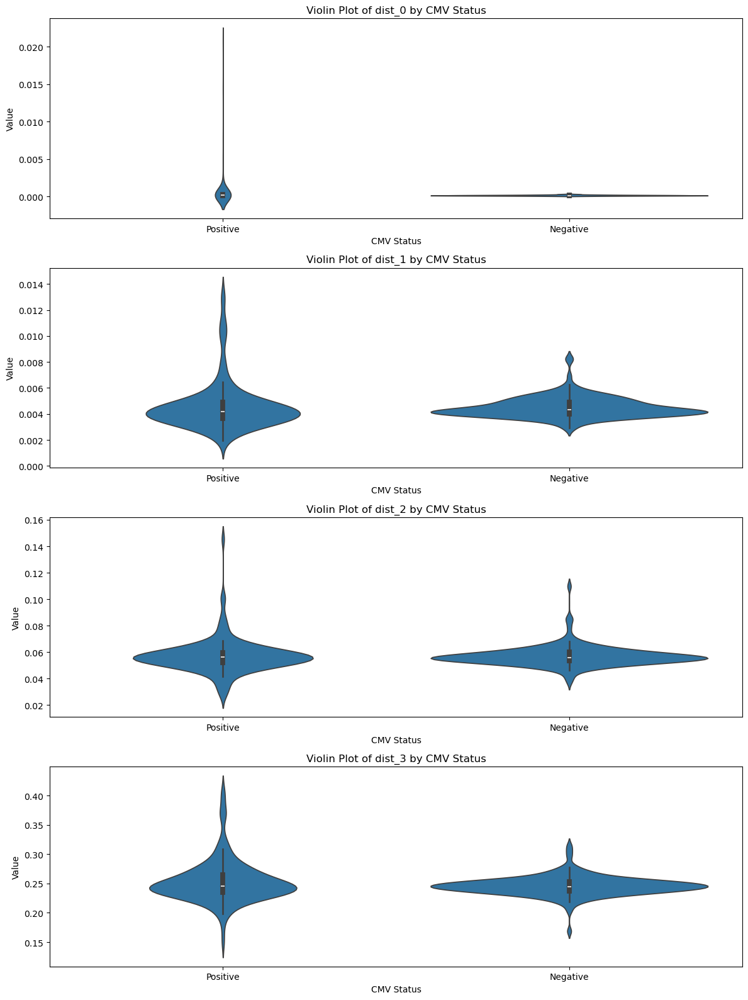

In [42]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Melt the dataframe for easier plotting
leven_melted = leven_freq.melt(
    id_vars="cmv_status", 
    value_vars=["dist_0", "dist_1", "dist_2", "dist_3"],
    var_name="Distance Metric", 
    value_name="Value"
)

# Create a figure with 4 separate subplots
distance_metrics = ["dist_0", "dist_1", "dist_2", "dist_3"]
plt.figure(figsize=(12, 16))

for i, dist in enumerate(distance_metrics):
    plt.subplot(4, 1, i+1)
    sns.violinplot(
        x="cmv_status", 
        y="Value", 
        data=leven_melted[leven_melted["Distance Metric"] == dist]
    )
    plt.title(f"Violin Plot of {dist} by CMV Status")
    plt.xlabel("CMV Status")
    plt.ylabel("Value")

plt.tight_layout()
plt.show()


Histograms

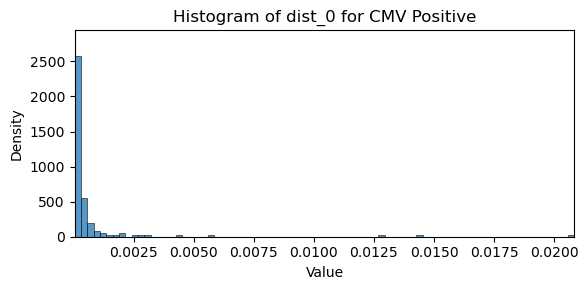

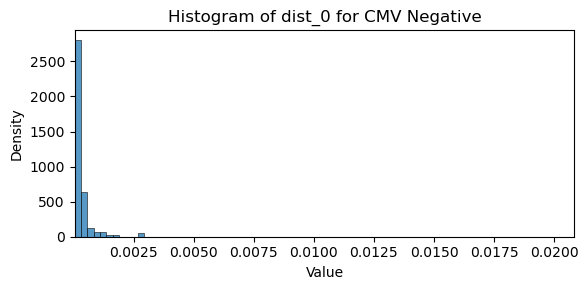

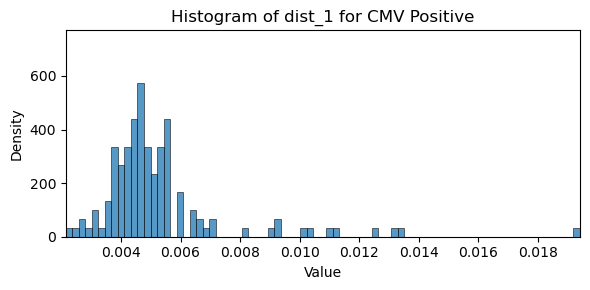

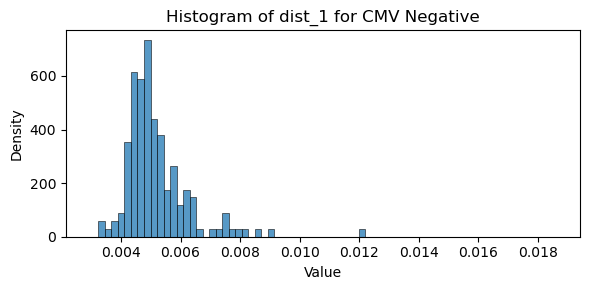

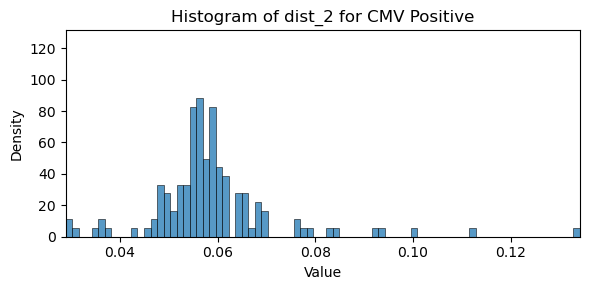

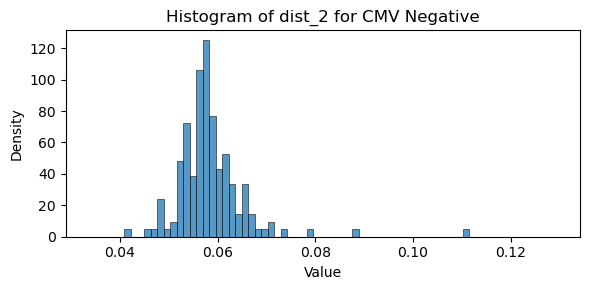

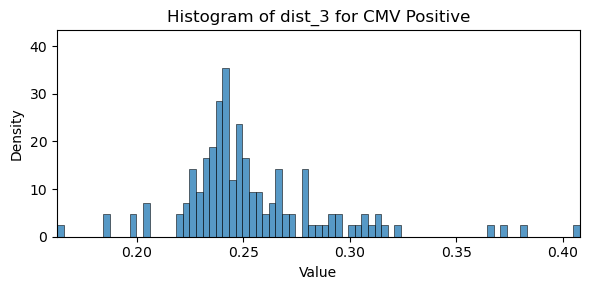

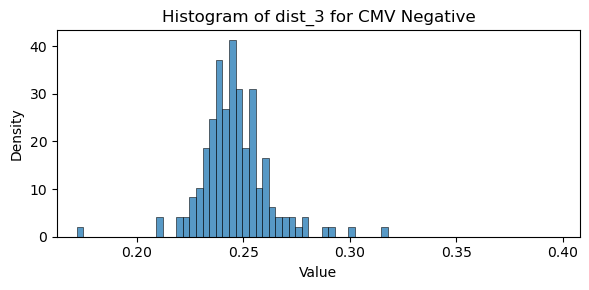

In [20]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Define the distance metrics
distance_metrics = ["dist_0", "dist_1", "dist_2", "dist_3"]
statuses = ["Positive", "Negative"]

for dist in distance_metrics:
    # Get global x-range for the current distance metric
    x_min = leven_freq[dist].min()
    x_max = leven_freq[dist].max()

    # Define common bin edges
    bins = np.linspace(x_min, x_max, 80)  # 30 equal-width bins

    # Estimate global max density for shared y-axis
    y_max = 0
    for status in statuses:
        subset = leven_freq[leven_freq["cmv_status"] == status]
        counts, _ = np.histogram(subset[dist], bins=bins, density=True)
        y_max = max(y_max, counts.max())

    # Plot histograms with shared bin edges and limits
    for status in statuses:
        plt.figure(figsize=(6, 3))
        subset = leven_freq[leven_freq["cmv_status"] == status]
        sns.histplot(
            data=subset,
            x=dist,
            bins=bins,
            kde=False,
            stat="density"
        )
        plt.title(f"Histogram of {dist} for CMV {status}")
        plt.xlabel("Value")
        plt.ylabel("Density")
        plt.xlim(x_min, x_max)
        plt.ylim(0, y_max * 1.05)
        plt.tight_layout()
        plt.show()


Raw distributions

In [112]:
df

,patient_id,dist_0,dist_1,dist_2,dist_3,cmv_status,cum_dist_0,cum_dist_1,cum_dist_2,cum_dist_3
0,P00492.slim.tsv,0.000351,0.004371,0.049764,0.265713,Positive,0.000351,0.004722,0.054487,0.320200
1,P00412.slim.tsv,0.004483,0.005231,0.055982,0.231906,Positive,0.004483,0.009714,0.065696,0.297601
2,P00416.slim.tsv,0.000153,0.006389,0.059150,0.249354,Negative,0.000153,0.006542,0.065692,0.315046
3,P00037.slim.tsv,0.000358,0.005816,0.058804,0.254780,Negative,0.000358,0.006174,0.064977,0.319757
4,P00346.slim.tsv,0.000100,0.012501,0.054036,0.271912,Positive,0.000100,0.012600,0.066636,0.338548
...,...,...,...,...,...,...,...,...,...,...
287,P00518.slim.tsv,0.000940,0.003664,0.065271,0.222193,Positive,0.000940,0.004604,0.069875,0.292069
288,P00132.slim.tsv,0.000253,0.005350,0.061528,0.253452,Negative,0.000253,0.005603,0.067131,0.320583
289,P00471.slim.tsv,0.000156,0.004728,0.066256,0.253536,Negative,0.000156,0.004884,0.071140,0.324677
290,P00133.slim.tsv,0.000202,0.004459,0.056386,0.258838,Negative,0.000202,0.004662,0.061048,0.319886


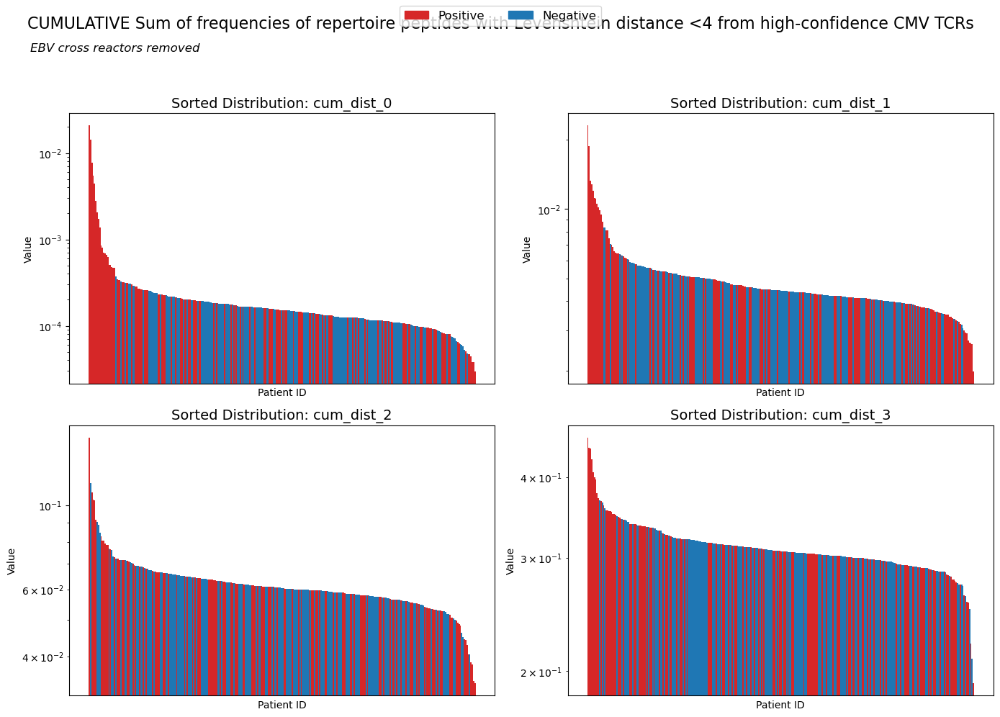

In [54]:
# change this depending on what you want to plot
df = freq_cum_df.copy()


import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# Columns to plot
dist_cols = ['cum_dist_0', 'cum_dist_1', 'cum_dist_2', 'cum_dist_3']

# Colour map for cmv_status
status_colors = {
    'Positive': 'tab:red',
    'Negative': 'tab:blue'
}

# Create a 2×2 grid of subplots
fig, axes = plt.subplots(2, 2, figsize=(14, 10), sharex=False)
axes = axes.flatten()

for ax, dist in zip(axes, dist_cols):
    # Sort rows by this dist column (largest first)
    df_sorted = df.sort_values(by=dist, ascending=False)
    
    x = df_sorted['patient_id']
    y = df_sorted[dist]
    bar_colors = df_sorted['cmv_status'].map(status_colors)
    
    ax.bar(x, y, color=bar_colors, width=1.0)
    ax.set_title(f'Sorted Distribution: {dist}', fontsize=14)
    ax.set_xlabel('Patient ID')
    ax.set_ylabel('Value')
    ax.tick_params(axis='x', rotation=90)
    # Remove x axis ticks
    ax.set_xticks([])
    # log y axis
    ax.set_yscale('log')

# Shared title and subtitle
fig.suptitle(f'CUMULATIVE Sum of frequencies of repertoire peptides with Levenshtein distance <4 from high-confidence CMV TCRs', fontsize=16)
fig.text(0.118, 0.93, 'EBV cross reactors removed', ha='center', fontsize=12, style='italic')

# Shared legend
patches = [mpatches.Patch(color=col, label=status) 
           for status, col in status_colors.items()]
fig.legend(handles=patches, loc='upper center', ncol=len(status_colors), fontsize=12)

fig.tight_layout(rect=[0, 0, 1, 0.92])
plt.show()


Do patients above the 'positive threshold' in all dist_s have the same patient ID?
- Visually define a threshold above which majority look positive
- Plot each distribution just above the threshold but with patient ID labels
- Create a big df with all patients above threshold, then value_count

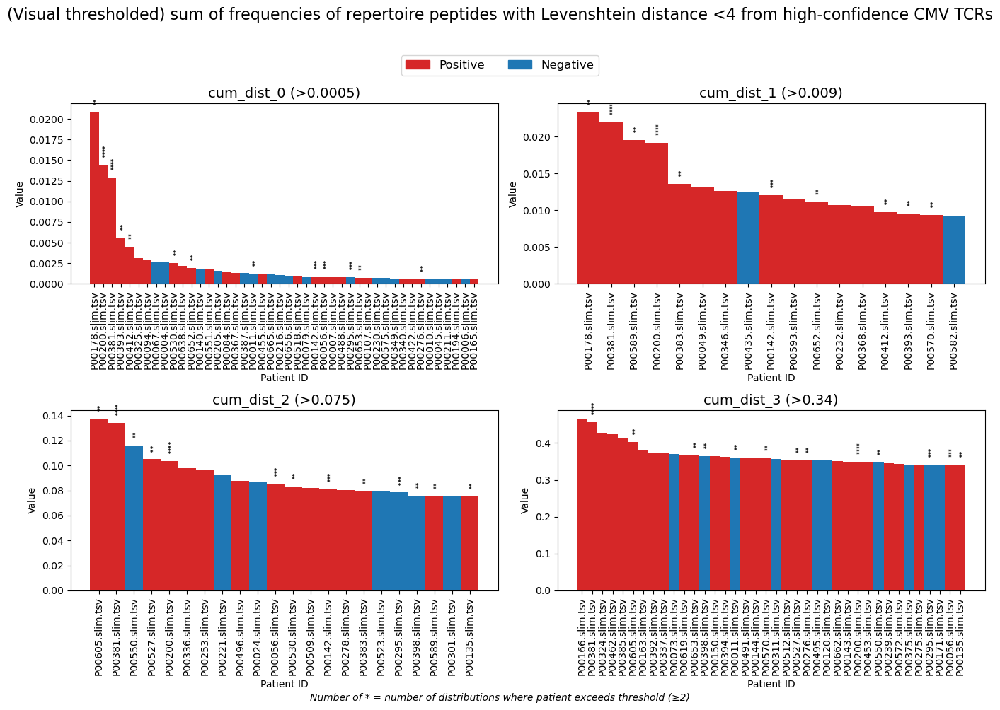

In [23]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np

# Columns to plot (cum)
dist_cols = ['cum_dist_0', 'cum_dist_1', 'cum_dist_2','cum_dist_3']

# Thresholds you define for each dist column
thresholds = {
    'cum_dist_0': 0.0005,
    'cum_dist_1': 0.009,
    'cum_dist_2': 0.075,
    'cum_dist_3': 0.34
}

# Colour map for cmv_status
status_colors = {
    'Positive': 'tab:red',
    'Negative': 'tab:blue'
}

# --- find patients appearing above threshold ---
patient_to_dists = {}

for dist in dist_cols:
    threshold = thresholds[dist]
    df_filtered = freq_cum_df[freq_cum_df[dist] > threshold]
    for patient in df_filtered['patient_id']:
        if patient not in patient_to_dists:
            patient_to_dists[patient] = []
        patient_to_dists[patient].append(dist)

# --- plotting ---
fig, axes = plt.subplots(2, 2, figsize=(14, 10), sharex=False)
axes = axes.flatten()

for ax, dist in zip(axes, dist_cols):
    # Filter by threshold
    threshold = thresholds[dist]
    df_filtered = freq_cum_df[freq_cum_df[dist] > threshold]
    
    # Sort the filtered DataFrame
    df_sorted = df_filtered.sort_values(by=dist, ascending=False)
    
    # Numeric x positions
    x_pos = np.arange(len(df_sorted))
    y = df_sorted[dist]
    bar_colors = df_sorted['cmv_status'].map(status_colors)
    
    # Plot bars first
    bars = ax.bar(x_pos, y, color=bar_colors, width=1.0, edgecolor='none')
    
    # Add as many stars as number of distributions patient appears in
    for idx, patient_id in enumerate(df_sorted['patient_id']):
        num_stars = len(patient_to_dists.get(patient_id, []))
        if num_stars >= 2:
            y_pos = y.iloc[idx] + 0.02 * y.max()
            ax.text(x_pos[idx], y_pos, '\n'.join(['*'] * num_stars), ha='center', va='bottom', fontsize=6, fontweight='bold', linespacing = 0.3)
            
    
    ax.set_xticks(x_pos)
    ax.set_xticklabels(df_sorted['patient_id'], rotation=90)
    
    ax.set_title(f'{dist} (>{threshold})', fontsize=14)
    ax.set_xlabel('Patient ID')
    ax.set_ylabel('Value')

# Shared legend
# Shared legend - moved lower to avoid title
patches = [mpatches.Patch(color=col, label=status) for status, col in status_colors.items()]
fig.legend(handles=patches, loc='upper center', bbox_to_anchor=(0.5, 0.92), ncol=len(status_colors), fontsize=12)



# Shared title
fig.suptitle(f'(Visual thresholded) sum of frequencies of repertoire peptides with Levenshtein distance <4 from high-confidence CMV TCRs', fontsize=16)


# Add note
note = "Number of * = number of distributions where patient exceeds threshold (≥2)"
fig.text(0.5, 0.01, note, ha='center', va='top', fontsize=10, fontstyle='italic')

fig.tight_layout(rect=[0, 0, 1, 0.92])
plt.show()


In [38]:
import pandas as pd

# Dictionary to track for each patient:
#   -> which distributions they appear in
#   -> and their rank within that distribution
patient_to_dists_and_ranks = {}

for dist in dist_cols:
    threshold = thresholds[dist]
    
    # Filter and sort for this dist
    df_filtered = leven_freq[leven_freq[dist] > threshold]
    df_sorted = df_filtered.sort_values(by=dist, ascending=False).reset_index(drop=True)
    
    for rank, row in df_sorted.iterrows():
        patient = row['patient_id']
        if patient not in patient_to_dists_and_ranks:
            patient_to_dists_and_ranks[patient] = []
        # Rank +1 because pandas index starts at 0
        patient_to_dists_and_ranks[patient].append((dist, rank + 1))

# Now print out the information
print("Patient -> Distributions exceeded + Rank:\n")
for patient, dist_rank_list in patient_to_dists_and_ranks.items():
    dist_rank_str = ', '.join([f"{dist} (rank {rank})" for dist, rank in dist_rank_list])
    print(f"{patient}: {dist_rank_str}")

# OPTIONAL: Turn it into a DataFrame for easier view
patient_summary = pd.DataFrame([
    {'patient_id': patient, 'distributions': ', '.join([f"{dist} (rank {rank})" for dist, rank in dist_ranks])}
    for patient, dist_ranks in patient_to_dists_and_ranks.items()
])

print("\nSummary table:")
print(patient_summary)


Patient -> Distributions exceeded + Rank:

P00178.slim.tsv: dist_0 (rank 1)
P00200.slim.tsv: dist_0 (rank 2), dist_2 (rank 8)
P00381.slim.tsv: dist_0 (rank 3), dist_1 (rank 12), dist_2 (rank 2), dist_3 (rank 5)
P00393.slim.tsv: dist_0 (rank 4)
P00412.slim.tsv: dist_0 (rank 5)
P00325.slim.tsv: dist_0 (rank 6)
P00589.slim.tsv: dist_1 (rank 1)
P00383.slim.tsv: dist_1 (rank 2)
P00049.slim.tsv: dist_1 (rank 3)
P00346.slim.tsv: dist_1 (rank 4), dist_3 (rank 35)
P00435.slim.tsv: dist_1 (rank 5)
P00142.slim.tsv: dist_1 (rank 6)
P00593.slim.tsv: dist_1 (rank 7)
P00232.slim.tsv: dist_1 (rank 8)
P00368.slim.tsv: dist_1 (rank 9)
P00570.slim.tsv: dist_1 (rank 10), dist_3 (rank 22)
P00652.slim.tsv: dist_1 (rank 11)
P00605.slim.tsv: dist_2 (rank 1)
P00550.slim.tsv: dist_2 (rank 3)
P00527.slim.tsv: dist_2 (rank 4)
P00336.slim.tsv: dist_2 (rank 5)
P00253.slim.tsv: dist_2 (rank 6)
P00221.slim.tsv: dist_2 (rank 7)
P00496.slim.tsv: dist_2 (rank 9)
P00024.slim.tsv: dist_2 (rank 10)
P00056.slim.tsv: dist_2 

Correlations between the distributions

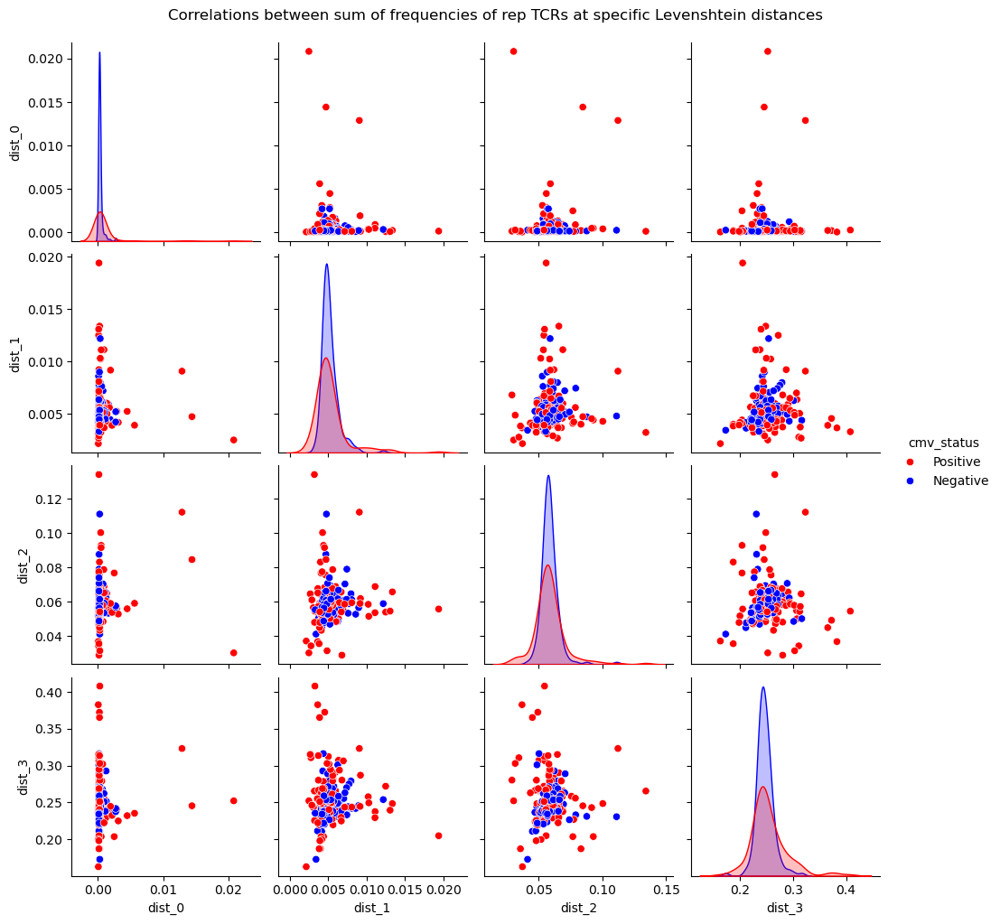

In [58]:
import seaborn as sns
import matplotlib.pyplot as plt

# Define flipped colour palette
flipped_palette = {
    'Positive': 'red',
    'Negative': 'blue'
}

# Pairplot with flipped colours
sns.pairplot(
    leven_freq,
    vars=['dist_0', 'dist_1', 'dist_2', 'dist_3'],
    hue='cmv_status',
    palette=flipped_palette,
    diag_kind='kde'
)
plt.suptitle("Correlations between sum of frequencies of rep TCRs at specific Levenshtein distances", y=1.02)
plt.show()


PCA

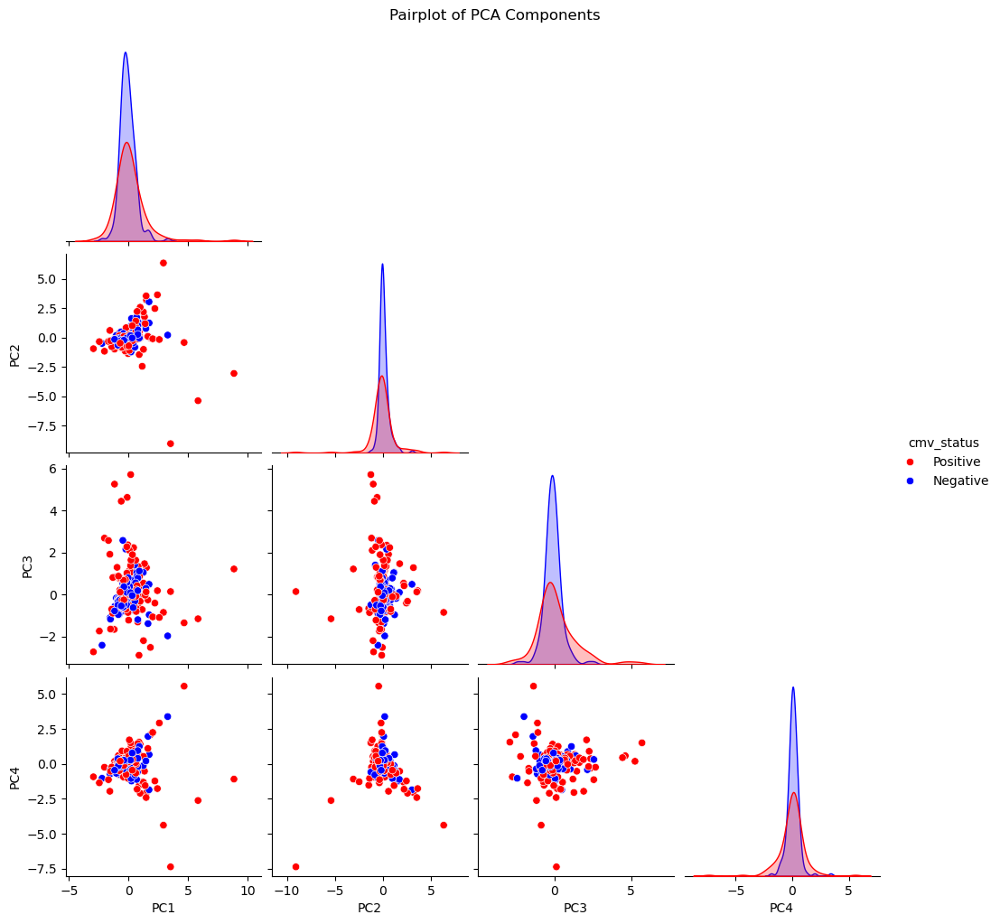

In [60]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Step 1: Select and standardize features
X = leven_freq[['dist_0', 'dist_1', 'dist_2', 'dist_3']]
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Step 2: Perform PCA
pca = PCA(n_components=4)
X_pca = pca.fit_transform(X_scaled)

# Step 3: Build a DataFrame for plotting
pca_df = pd.DataFrame(X_pca, columns=[f'PC{i+1}' for i in range(4)])
pca_df['cmv_status'] = leven_freq['cmv_status']
pca_df['patient_id'] = leven_freq['patient_id']

# Step 4: Create a pairplot
sns.pairplot(
    pca_df,
    vars=[f'PC{i+1}' for i in range(4)],
    hue='cmv_status',
    palette={'Positive': 'red', 'Negative': 'blue'},
    diag_kind='kde',
    corner=True  # optional: only plot lower triangle (cleaner)
)

plt.suptitle('Pairplot of PCA Components', y=1.02)
plt.show()


Cumulative frequencies

In [ ]:
# Change df 
dist_cols = [c for c in freq_df.columns if c.startswith("dist_")]
max_distance = max(int(c.split("_")[1]) for c in dist_cols)


In [97]:
freq_df

,patient_id,dist_0,dist_1,dist_2,dist_3,cum_freq_ge_1,cum_freq_ge_2,cum_freq_ge_3
0,P00492.slim.tsv,0.000351,0.004371,0.049764,0.265713,0.319849,0.315478,0.265713
1,P00412.slim.tsv,0.004483,0.005231,0.055982,0.231906,0.293119,0.287888,0.231906
2,P00416.slim.tsv,0.000153,0.006389,0.059150,0.249354,0.314893,0.308504,0.249354
3,P00037.slim.tsv,0.000358,0.005816,0.058804,0.254780,0.319399,0.313583,0.254780
4,P00346.slim.tsv,0.000100,0.012501,0.054036,0.271912,0.338448,0.325947,0.271912
...,...,...,...,...,...,...,...,...
287,P00518.slim.tsv,0.000940,0.003664,0.065271,0.222193,0.291128,0.287465,0.222193
288,P00132.slim.tsv,0.000253,0.005350,0.061528,0.253452,0.320330,0.314980,0.253452
289,P00471.slim.tsv,0.000156,0.004728,0.066256,0.253536,0.324521,0.319792,0.253536
290,P00133.slim.tsv,0.000202,0.004459,0.056386,0.258838,0.319684,0.315225,0.258838


Logistic regression?

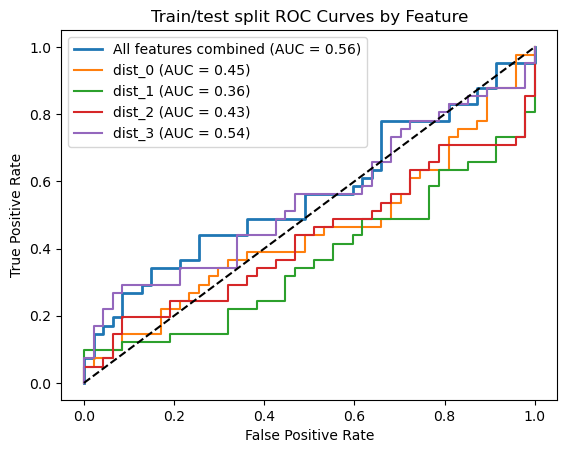

In [22]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedKFold, cross_val_predict, train_test_split
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
import matplotlib.pyplot as plt
import numpy as np

use_cross_val = False

# 2. Filter to binary classes and encode
leven_freq_bin = leven_freq[leven_freq['cmv_status'].isin(['Positive', 'Negative'])].copy()
leven_freq_bin['y'] = np.where(leven_freq_bin['cmv_status'] == 'Positive', 1, 0)

# Define features and labels
individual_features = ['dist_0', 'dist_1', 'dist_2', 'dist_3']
X = leven_freq_bin[individual_features]
y = leven_freq_bin['y']


# 4. Prepare CV or train/test split
if use_cross_val:
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    split_method = lambda model, X, y: cross_val_predict(model, X, y, cv=cv, method='predict_proba')[:, 1]
else:
    X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.3, random_state=42)
    def split_method(model, X, y):
        model.fit(X_train[X.columns], y_train)
        return model.predict_proba(X_test[X.columns])[:, 1]


# 5. Plot ROC for all features combined
pipeline_all = make_pipeline(StandardScaler(), LogisticRegression(solver='liblinear'))
y_proba_all = split_method(pipeline_all, X, y)
if use_cross_val:
    fpr_all, tpr_all, _ = roc_curve(y, y_proba_all)
    auc_all = roc_auc_score(y, y_proba_all)
else:
    fpr_all, tpr_all, _ = roc_curve(y_test, y_proba_all)
    auc_all = roc_auc_score(y_test, y_proba_all)


plt.figure()
plt.plot(fpr_all, tpr_all, label=f"All features combined (AUC = {auc_all:.2f})", linewidth=2)

# 6. Plot ROC for each individual feature
for feat in individual_features:
    Xi = leven_freq_bin[[feat]]
    pipeline_feat = make_pipeline(StandardScaler(), LogisticRegression(solver='liblinear'))
    if use_cross_val:
        y_proba_feat = cross_val_predict(pipeline_feat, Xi, y, cv=cv, method='predict_proba')[:, 1]
        fpr, tpr, _ = roc_curve(y, y_proba_feat)
        auc_feat = roc_auc_score(y, y_proba_feat)
    else:
        Xi_train, Xi_test = X_train[[feat]], X_test[[feat]]
        pipeline_feat.fit(Xi_train, y_train)
        y_proba_feat = pipeline_feat.predict_proba(Xi_test)[:, 1]
        fpr, tpr, _ = roc_curve(y_test, y_proba_feat)
        auc_feat = roc_auc_score(y_test, y_proba_feat)

    plt.plot(fpr, tpr, label=f"{feat} (AUC = {auc_feat:.2f})")

# 7. Finalise plot
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
title = "Cross-validated" if use_cross_val else "Train/test split"
plt.title(f"{title} ROC Curves by Feature")
plt.legend()
plt.show()


### Update to use TCRdist

In [ ]:
import os
from collections import defaultdict

import numpy as np
import pandas as pd

# 1) Import your TCRdist function
#    (Adjust this import to match the package you installed)
from tcrdist.distances import tcrdist  

# ——————————————————————————————————————————————————————
# Your parameters
max_distance = 3
output_file  = '/Users/ishaharris/.../freqs_tcrdist_output.csv'
col_names    = ['patient_id', 'total_freq_dist<3']

# 2) Bucket high-confidence sequences by length
hc_buckets = defaultdict(list)
for seq in highconf_seqs:
    hc_buckets[len(seq)].append(seq)

def closest_tcrdist(seq, max_d=max_distance):
    """
    Return the smallest TCRdist between `seq` and any high-conf seq,
    but only consider high-conf sequences whose lengths differ by ≤ max_d.
    If none are < max_d, returns max_d+1.
    """
    L_seq = len(seq)
    best  = max_d + 1

    # Only compare to buckets within ±max_d in length
    for target_len in range(L_seq - max_d, L_seq + max_d + 1):
        for hc in hc_buckets.get(target_len, []):
            d = tcrdist(seq, hc)       # ← your TCRdist call
            if d < best:
                best = d
                if best == 0:         # exact TCR match
                    return 0
    return best

# 3) Prepare (or resume) the output DataFrame
if os.path.exists(output_file):
    freq_df   = pd.read_csv(output_file)
    completed = set(freq_df['patient_id'])
else:
    freq_df   = pd.DataFrame(columns=col_names)
    completed = set()

# 4) Process each patient file
for file_name in file_names:
    if file_name in completed:
        print(f"Skipping {file_name}, already done.")
        continue

    print(f"Processing {file_name}…")
    try:
        rep = (
            pd.read_csv(
                f'/Volumes/.../{file_name}',
                sep='\t',
                usecols=['amino_acid', 'frequency']
            )
            .dropna()
        )
    except Exception as e:
        print(f"  Error reading {file_name}: {e}")
        continue

    seqs  = rep['amino_acid'].to_numpy()
    freqs = rep['frequency'].to_numpy()

    # 5) Compute the closest TCRdist for each sequence
    min_ds = [closest_tcrdist(s) for s in seqs]

    # 6) Keep only those with distance < 3
    mask       = np.array(min_ds) < max_distance
    total_freq = freqs[mask].sum()

    # 7) Append results & save
    row = {
        'patient_id':           file_name,
        'total_freq_dist<3':    total_freq
    }
    freq_df = pd.concat([freq_df, pd.DataFrame([row])], ignore_index=True)
    freq_df.to_csv(output_file, index=False)

    print(f"  Saved {file_name}: total_freq_dist<3 = {total_freq}")


In [163]:
# output the column names for a df called rep
l = rep.columns.tolist()
print(l)



['sample_name', 'species', 'locus', 'product_subtype', 'kit_pool', 'sku', 'test_name', 'sample_catalog_tags', 'sample_rich_tags', 'sample_rich_tags_json', 'hla_class_i', 'hla_class_ii', 'kit_control', 'total_templates', 'productive_templates', 'outofframe_templates', 'stop_templates', 'dj_templates', 'total_rearrangements', 'productive_rearrangements', 'outofframe_rearrangements', 'stop_rearrangements', 'dj_rearrangements', 'total_reads', 'total_productive_reads', 'total_outofframe_reads', 'total_stop_reads', 'total_dj_reads', 'productive_simpson_clonality', 'productive_clonality', 'productive_entropy', 'sample_simpson_clonality', 'sample_clonality', 'sample_entropy', 'sample_amount_ng', 'sample_cells_mass_estimate', 'fraction_productive_of_cells_mass_estimate', 'sample_cells', 'fraction_productive_of_cells', 'max_productive_frequency', 'max_frequency', 'counting_method', 'primer_set', 'sequence_result_status', 'release_date', 'upload_date', 'sample_tags', 'fraction_productive', 'order

### Recall at different thresholds
- Plot a cumulative freq to see thresholds

In [13]:
directory = '/Users/ishaharris/Projects/TCR/TCR-Isha/data/Levenshtein/output'
file = 'top50_freqs.csv'

df = pd.read_csv(f'{directory}/{file}')

df

,patient_id,dist_0,dist_1,dist_2,dist_3
0,P00492.slim.tsv,0.000239,0.001080,0.020075,0.149426
1,P00412.slim.tsv,0.000023,0.001287,0.020535,0.122887
2,P00416.slim.tsv,0.000027,0.002023,0.022578,0.144626
3,P00037.slim.tsv,0.000025,0.001965,0.025119,0.143745
4,P00346.slim.tsv,0.000000,0.008747,0.022884,0.144700
...,...,...,...,...,...
287,P00518.slim.tsv,0.000094,0.000924,0.021090,0.146119
288,P00132.slim.tsv,0.000017,0.001159,0.023466,0.138273
289,P00471.slim.tsv,0.000000,0.001285,0.024269,0.143600
290,P00133.slim.tsv,0.000012,0.001298,0.021839,0.145660


In [11]:
## Add CMV status
df['cmv_status'] = np.where(
    df['patient_id'].isin(pos_names),
    'Positive',
    np.where(df['patient_id'].isin(neg_names), 'Negative', 'unknown')
)

df

,patient_id,dist_0,dist_1,dist_2,dist_3,cmv_status
0,P00492.slim.tsv,0.000239,0.001080,0.020075,0.149426,Positive
1,P00412.slim.tsv,0.000023,0.001287,0.020535,0.122887,Positive
2,P00416.slim.tsv,0.000027,0.002023,0.022578,0.144626,Negative
3,P00037.slim.tsv,0.000025,0.001965,0.025119,0.143745,Negative
4,P00346.slim.tsv,0.000000,0.008747,0.022884,0.144700,Positive
...,...,...,...,...,...,...
287,P00518.slim.tsv,0.000094,0.000924,0.021090,0.146119,Positive
288,P00132.slim.tsv,0.000017,0.001159,0.023466,0.138273,Negative
289,P00471.slim.tsv,0.000000,0.001285,0.024269,0.143600,Negative
290,P00133.slim.tsv,0.000012,0.001298,0.021839,0.145660,Negative


In [12]:
df

,patient_id,dist_0,dist_1,dist_2,dist_3,cmv_status
0,P00492.slim.tsv,0.000239,0.001080,0.020075,0.149426,Positive
1,P00412.slim.tsv,0.000023,0.001287,0.020535,0.122887,Positive
2,P00416.slim.tsv,0.000027,0.002023,0.022578,0.144626,Negative
3,P00037.slim.tsv,0.000025,0.001965,0.025119,0.143745,Negative
4,P00346.slim.tsv,0.000000,0.008747,0.022884,0.144700,Positive
...,...,...,...,...,...,...
287,P00518.slim.tsv,0.000094,0.000924,0.021090,0.146119,Positive
288,P00132.slim.tsv,0.000017,0.001159,0.023466,0.138273,Negative
289,P00471.slim.tsv,0.000000,0.001285,0.024269,0.143600,Negative
290,P00133.slim.tsv,0.000012,0.001298,0.021839,0.145660,Negative


In [8]:
# get the range of dist_0
min_val = df['dist_0'].min()
max_val = df['dist_0'].max()
print(f"Min: {min_val}, Max: {max_val}")

Min: 0.0, Max: 0.0142987817231749


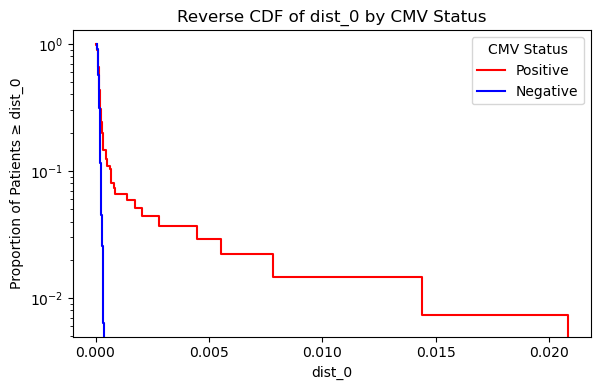

In [39]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(6, 4))

# Define color map
color_map = {'Positive': 'red', 'Negative': 'blue'}

# Plot reverse CDF for each CMV status
for status in df['cmv_status'].unique():
    subset = df[df['cmv_status'] == status]['dist_0'].sort_values()
    y = 1 - np.arange(1, len(subset)+1) / len(subset)
    plt.step(subset, y, where='post', label=status, color=color_map[status])

plt.xlabel('dist_0')
plt.ylabel('Proportion of Patients ≥ dist_0')
plt.title('Reverse CDF of dist_0 by CMV Status')
plt.legend(title='CMV Status')
plt.tight_layout()
# log y axis
plt.yscale('log')
plt.show()


In [35]:
# For CMV-positive
cmv_pos = df[df['cmv_status'] == 'Positive']
min_val_pos = cmv_pos['dist_0'].min()
max_val_pos = cmv_pos['dist_0'].max()
print(f"CMV Positive - Min: {min_val_pos}, Max: {max_val_pos}")

# For CMV-negative
cmv_neg = df[df['cmv_status'] == 'Negative']
min_val_neg = cmv_neg['dist_0'].min()
max_val_neg = cmv_neg['dist_0'].max()
print(f"CMV Negative - Min: {min_val_neg}, Max: {max_val_neg}")


CMV Positive - Min: 2.9663646319543218e-05, Max: 0.0208164352122713
CMV Negative - Min: 4.747097644886225e-05, Max: 0.0003739708118342


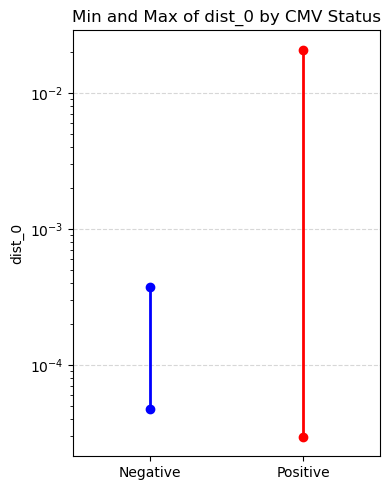

In [42]:
import matplotlib.pyplot as plt

# Calculate min and max
stats = df.groupby('cmv_status')['dist_0'].agg(['min', 'max'])

# Define colors
color_map = {'Positive': 'red', 'Negative': 'blue'}

# Plot
fig, ax = plt.subplots(figsize=(4, 5))  # Smaller width for compactness

for i, status in enumerate(stats.index):
    min_val = stats.loc[status, 'min']
    max_val = stats.loc[status, 'max']
    color = color_map.get(status, 'black')
    ax.plot([i, i], [min_val, max_val], marker='o', color=color, linewidth=2)

ax.set_xticks(range(len(stats.index)))
ax.set_xticklabels(stats.index)
ax.set_xlim(-0.5, len(stats.index) - 0.5)  # Tighten x-axis limits
ax.set_ylabel('dist_0')
ax.set_title('Min and Max of dist_0 by CMV Status')
# log y axis
ax.set_yscale('log')

plt.grid(True, axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


### What proportion of positives vs negatives do we capture at each dist_0 value?

In [43]:
n=50 

## Load in data
directory = '/Users/ishaharris/Projects/TCR/TCR-Isha/data/Levenshtein/output'
file = f'top{n}_freqs.csv'

df = pd.read_csv(f'{directory}/{file}')

## Add CMV status
df['cmv_status'] = np.where(
    df['patient_id'].isin(pos_names),
    'Positive',
    np.where(df['patient_id'].isin(neg_names), 'Negative', 'unknown')
)

In [57]:
df['cmv_positive'] = df['cmv_status'].str.lower() == 'positive'

df

# get max value of dist_0
max_val = df['dist_0'].max()
min_val = df['dist_0'].min()
max_val = 3.77e-04	

print(f"Max: {max_val}, Min: {min_val}")

# Define thresholds to evaluate
thresholds = np.linspace(0.000045, 0.00005, 50)  # 0.0 to 0.4 in steps of 0.02

results = []
for threshold in thresholds:
    subset = df[df['dist_0'] > threshold]
    if len(subset) > 0:
        percent_positive = 100 * subset['cmv_positive'].mean()
        results.append((threshold, len(subset), percent_positive))
    else:
        results.append((threshold, 0, np.nan))

# Convert results to DataFrame
result_df = pd.DataFrame(results, columns=['threshold', 'n_patients', 'percent_positive'])
df_sn = result_df.copy()

df_sn['threshold'] = df_sn['threshold'].apply(lambda x: f"{x:.2e}")

# plot a graph of df_sn

print(f'Total positive: {len(pos_names)}')
print(f'Total negative: {len(neg_names)}')

df_sn.head(50)

Max: 0.000377, Min: 0.0
Total positive: 136
Total negative: 156


,threshold,n_patients,percent_positive
0,4.50e-05,42,78.571429
1,4.51e-05,42,78.571429
2,4.52e-05,42,78.571429
3,4.53e-05,42,78.571429
4,4.54e-05,42,78.571429
5,4.55e-05,42,78.571429
6,4.56e-05,41,80.487805
7,4.57e-05,41,80.487805
8,4.58e-05,41,80.487805
9,4.59e-05,41,80.487805


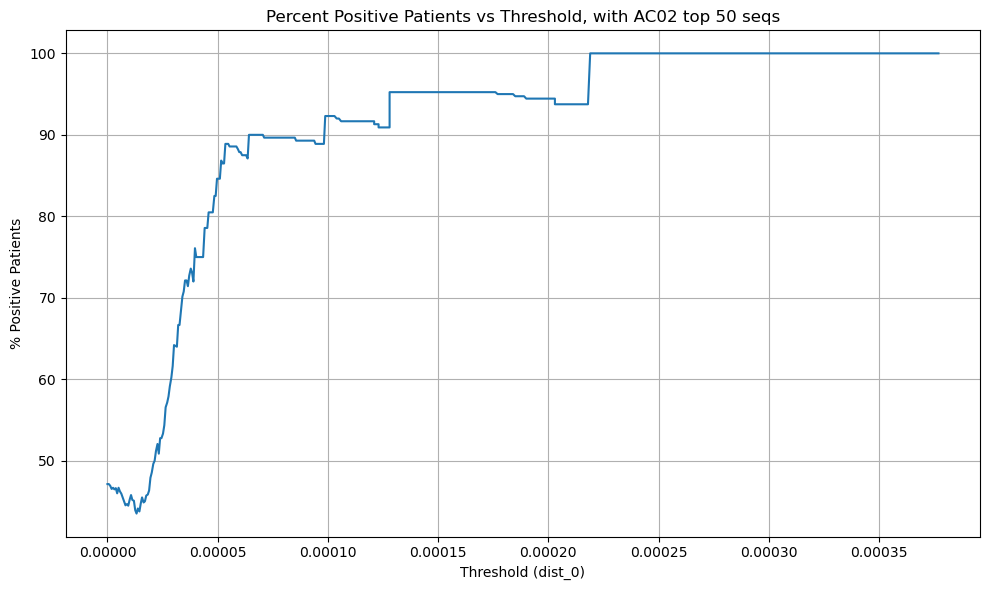

In [45]:
# If your DataFrame is in scientific notation as strings, convert threshold back to float
df_sn['threshold'] = df_sn['threshold'].astype(float)
df_sn['percent_positive'] = df_sn['percent_positive'].astype(float)

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(df_sn['threshold'], df_sn['percent_positive'], linestyle='-')

plt.xlabel('Threshold (dist_0)')
plt.ylabel('% Positive Patients')
plt.title(f'Percent Positive Patients vs Threshold, with AC02 top {n} seqs')
plt.grid(True)
plt.tight_layout()
plt.show()

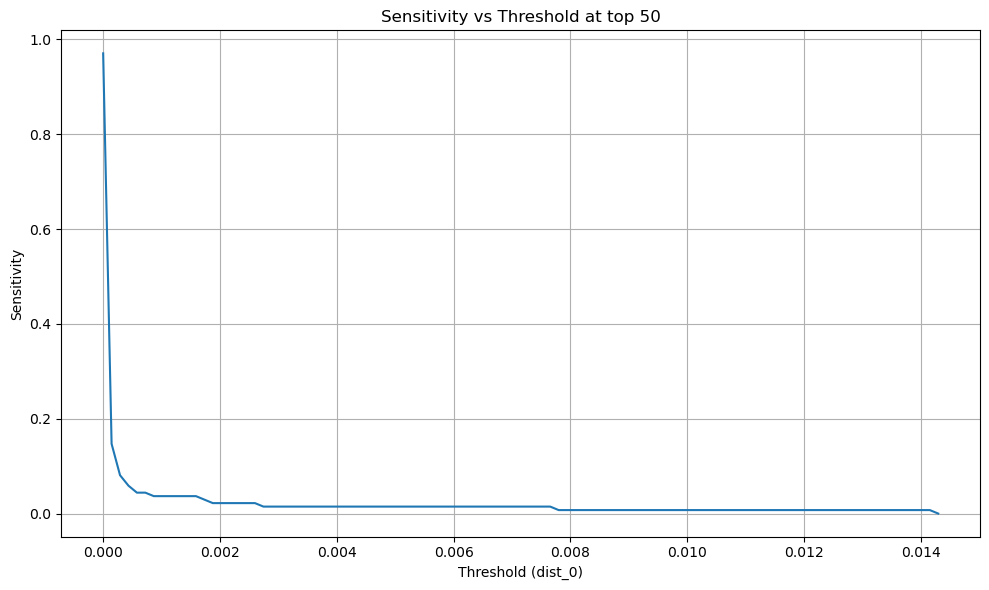

In [47]:
thresholds = np.linspace(min(df['dist_0']), max(df['dist_0']), 100)
sensitivities = []

for t in thresholds:
    positives = df[df['cmv_status'] == 'Positive']
    true_positives = positives[positives['dist_0'] > t]
    sensitivity = len(true_positives) / len(positives)
    sensitivities.append(sensitivity)

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(thresholds, sensitivities)
plt.xlabel('Threshold (dist_0)')
plt.ylabel('Sensitivity')
plt.title(f'Sensitivity vs Threshold at top {n}')
plt.grid(True)
plt.tight_layout()
plt.show()


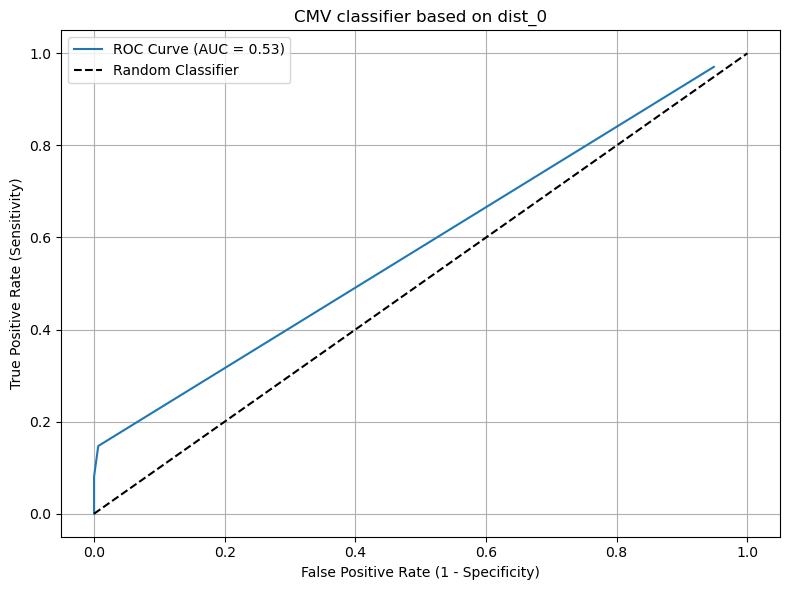

In [48]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import auc

# Assume df is already loaded
df['cmv_binary'] = (df['cmv_status'] == 'Positive').astype(int)

# Sweep thresholds across dist_0 range
thresholds = np.linspace(df['dist_0'].min(), df['dist_0'].max(), 100)
sensitivities = []
specificities = []

for t in thresholds:
    pred_positive = df['dist_0'] > t
    true_positive = (pred_positive & (df['cmv_binary'] == 1)).sum()
    false_negative = ((~pred_positive) & (df['cmv_binary'] == 1)).sum()
    true_negative = ((~pred_positive) & (df['cmv_binary'] == 0)).sum()
    false_positive = (pred_positive & (df['cmv_binary'] == 0)).sum()

    sensitivity = true_positive / (true_positive + false_negative)
    specificity = true_negative / (true_negative + false_positive)

    sensitivities.append(sensitivity)
    specificities.append(specificity)

# Compute False Positive Rate
fpr = [1 - spec for spec in specificities]

# Calculate AUC using sklearn
roc_auc = auc(fpr, sensitivities)

# Plot ROC Curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, sensitivities, label=f'ROC Curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], 'k--', label='Random Classifier')
plt.xlabel('False Positive Rate (1 - Specificity)')
plt.ylabel('True Positive Rate (Sensitivity)')
plt.title('CMV classifier based on dist_0')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [98]:
thresholds = np.linspace(0.000030	, 0.000383, 10)

roc_data = []

for t in thresholds:
    pred_positive = df['dist_0'] > t
    tp = (pred_positive & (df['cmv_binary'] == 1)).sum()
    fn = ((~pred_positive) & (df['cmv_binary'] == 1)).sum()
    tn = ((~pred_positive) & (df['cmv_binary'] == 0)).sum()
    fp = (pred_positive & (df['cmv_binary'] == 0)).sum()

    tpr = tp / (tp + fn) if (tp + fn) else 0
    fpr = fp / (fp + tn) if (fp + tn) else 0
    roc_data.append((t, tpr, fpr))


In [99]:
roc_df = pd.DataFrame(roc_data, columns=['threshold', 'tpr', 'fpr'])


#see rows 800-900
roc_df.iloc[0:50]

,threshold,tpr,fpr
0,0.000030,0.992647,1.000000
1,0.000069,0.933824,0.961538
2,0.000108,0.779412,0.826923
3,0.000148,0.566176,0.493590
4,0.000187,0.404412,0.230769
5,0.000226,0.308824,0.102564
6,0.000265,0.235294,0.044872
7,0.000305,0.198529,0.032051
8,0.000344,0.147059,0.006410
9,0.000383,0.147059,0.000000


### Get a list of high burden, positive patients

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pickle

In [6]:
directory = '/Users/ishaharris/Projects/TCR/TCR-Isha/data/Levenshtein'
file = 'freqs_leven_withoutEBV.csv'

df = pd.read_csv(f'{directory}/output/{file}')

df

,patient_id,dist_0,dist_1,dist_2,dist_3,dist_4,cmv_status,cum_dist_0,cum_dist_1,cum_dist_2,cum_dist_3,cum_dist_4
0,P00492.slim.tsv,0.000342,0.003791,0.060875,0.236598,0.317638,Positive,0.000342,0.004134,0.065009,0.301607,0.619245
1,P00412.slim.tsv,0.004467,0.004993,0.053604,0.241249,0.310048,Positive,0.004467,0.009459,0.063064,0.304313,0.614361
2,P00416.slim.tsv,0.000125,0.005127,0.055752,0.255978,0.334402,Negative,0.000125,0.005253,0.061005,0.316983,0.651384
3,P00037.slim.tsv,0.000116,0.005569,0.058191,0.255230,0.335606,Negative,0.000116,0.005685,0.063876,0.319106,0.654712
4,P00346.slim.tsv,0.000063,0.011064,0.053198,0.271741,0.276404,Positive,0.000063,0.011127,0.064325,0.336066,0.612470
...,...,...,...,...,...,...,...,...,...,...,...,...
287,P00518.slim.tsv,0.000849,0.003255,0.057346,0.245395,0.337875,Positive,0.000849,0.004104,0.061450,0.306845,0.644720
288,P00132.slim.tsv,0.000180,0.004715,0.060308,0.254113,0.326093,Negative,0.000180,0.004895,0.065203,0.319316,0.645409
289,P00471.slim.tsv,0.000114,0.004202,0.064539,0.265388,0.331363,Negative,0.000114,0.004317,0.068856,0.334244,0.665607
290,P00133.slim.tsv,0.000166,0.004094,0.055167,0.256163,0.320830,Negative,0.000166,0.004259,0.059427,0.315589,0.636419


In [4]:
df_filtered

NameError: name 'df_filtered' is not defined

In [56]:
# filter for dist_0 > 0.000375, and just keep dist_0
df_filtered = df[df['dist_0'] > 0.000375][['patient_id', 'dist_0', 'cmv_status']]
df_filtered

,patient_id,dist_0,cmv_status
1,P00412.slim.tsv,0.004467,Positive
14,P00422.slim.tsv,0.000510,Positive
15,P00381.slim.tsv,0.007807,Positive
42,P00178.slim.tsv,0.020816,Positive
46,P00336.slim.tsv,0.000473,Positive
56,P00094.slim.tsv,0.002071,Positive
63,P00551.slim.tsv,0.001720,Positive
70,P00393.slim.tsv,0.005514,Positive
81,P00084.slim.tsv,0.001377,Positive
85,P00488.slim.tsv,0.000669,Positive


In [57]:

# export patient_id (without .slim.tsv) to a list

# export patient_id col to a list
patient_ids = df_filtered['patient_id'].tolist()
# save as a pickle
# save as a pickle
with open(f'{directory}/pickles/HighBurden_PatientIDs.pkl', 'wb') as f:
    pickle.dump(patient_ids, f)


Analyse high burden

In [9]:
# load high conf
######
highconf_file_name = 'WITHOUT_EBV_highconf.tsv'
#######

highconf = pd.read_csv(f'/Users/ishaharris/Projects/TCR/TCR-Isha/data/High_Confidence_CMV_TCR/{highconf_file_name}', sep='\t')

highconf

highconf_seqs = highconf.loc[:,'amino_acid'].tolist()
len(highconf_seqs)

# keep only the uniques
highconf_seqs = list(set(highconf_seqs))


In [5]:
# read in pikcle
with open(f'{directory}/pickles/HighBurden_PatientIDs.pkl', 'rb') as f:
    high_burden_patient_ids = pickle.load(f)

high_burden_patient_ids

['P00412.slim.tsv',
 'P00422.slim.tsv',
 'P00381.slim.tsv',
 'P00178.slim.tsv',
 'P00336.slim.tsv',
 'P00094.slim.tsv',
 'P00551.slim.tsv',
 'P00393.slim.tsv',
 'P00084.slim.tsv',
 'P00488.slim.tsv',
 'P00007.slim.tsv',
 'P00325.slim.tsv',
 'P00107.slim.tsv',
 'P00191.slim.tsv',
 'P00340.slim.tsv',
 'P00165.slim.tsv',
 'P00276.slim.tsv',
 'P00455.slim.tsv',
 'P00200.slim.tsv',
 'P00518.slim.tsv']

NameError: name 'contrib' is not defined

In [23]:
compute_freqs_and_contributors(
    highconf_seqs=highconf_seqs,
    file_names=high_burden_patient_ids,
    max_distance=4,
    input_dir='/Volumes/IshaVerbat/Isha/TCR/filtered_for_tcrdist',
    output_file=f'{directory}/output/HighBurden_PatientIDs_freqs.csv',
    sep='\t',
    seq_col='cdr3_b_aa',
    freq_col='productive_frequency',
    contributors_output=f'{directory}/output/HighBurden_PatientIDs_contributors.pkl'
)

[1/20] Processing P00412.slim.tsv… 

/var/folders/ls/vwbn46k51_dbtpbp9vjn8kzh0000gq/T/ipykernel_2967/541423737.py:100: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  freq_df = pd.concat([freq_df, pd.DataFrame([row])], ignore_index=True)


Done
[2/20] Processing P00422.slim.tsv… Done
[3/20] Processing P00381.slim.tsv… Done
[4/20] Processing P00178.slim.tsv… Done
[5/20] Processing P00336.slim.tsv… Done
[6/20] Processing P00094.slim.tsv… Done
[7/20] Processing P00551.slim.tsv… Done
[8/20] Processing P00393.slim.tsv… Done
[9/20] Processing P00084.slim.tsv… Done
[10/20] Processing P00488.slim.tsv… Done
[11/20] Processing P00007.slim.tsv… Done
[12/20] Processing P00325.slim.tsv… Done
[13/20] Processing P00107.slim.tsv… Done
[14/20] Processing P00191.slim.tsv… Done
[15/20] Processing P00340.slim.tsv… Done
[16/20] Processing P00165.slim.tsv… Done
[17/20] Processing P00276.slim.tsv… Done
[18/20] Processing P00455.slim.tsv… Done
[19/20] Processing P00200.slim.tsv… Done
[20/20] Processing P00518.slim.tsv… Done


(         patient_id    dist_0    dist_1    dist_2    dist_3    dist_4
 0   P00412.slim.tsv  0.004467  0.004993  0.053604  0.241249  0.310048
 1   P00422.slim.tsv  0.000510  0.004191  0.059129  0.236346  0.318754
 2   P00381.slim.tsv  0.007807  0.004193  0.067351  0.364638  0.276984
 3   P00178.slim.tsv  0.020816  0.002130  0.030244  0.251792  0.295297
 4   P00336.slim.tsv  0.000473  0.003825  0.087089  0.202144  0.363141
 5   P00094.slim.tsv  0.002071  0.004187  0.056154  0.243628  0.348792
 6   P00551.slim.tsv  0.001720  0.005127  0.052513  0.245064  0.351793
 7   P00393.slim.tsv  0.005514  0.003306  0.057302  0.248485  0.337153
 8   P00084.slim.tsv  0.001377  0.003669  0.050409  0.251184  0.336292
 9   P00488.slim.tsv  0.000669  0.005110  0.047483  0.223965  0.327141
 10  P00007.slim.tsv  0.000807  0.003878  0.057533  0.223334  0.287177
 11  P00325.slim.tsv  0.002790  0.004215  0.053348  0.228812  0.371014
 12  P00107.slim.tsv  0.000683  0.004223  0.057062  0.229330  0.341675
 13  P

In [9]:
# Read the pickle
with open(f'{directory}/output/HighBurden_PatientIDs_contributors.pkl', 'rb') as f:
    contributors = pickle.load(f)

contributors

{'P00412.slim.tsv': {0: [('CASSLGETQYF', np.float64(3.615386506509865e-07)),
   ('CASSLGGGAYTEAFF', np.float64(1.6269239279294392e-06)),
   ('CASSLGETQYF', np.float64(9.038466266274662e-07)),
   ('CASSLGQTYEQYF', np.float64(1.2653852772784528e-06)),
   ('CASSYSGNTEAFF', np.float64(7.23077301301973e-07)),
   ('CASSLGETQYF', np.float64(5.423079759764797e-07)),
   ('CASSYSGNTEAFF', np.float64(7.23077301301973e-07)),
   ('CASSYSGNTEAFF', np.float64(1.0846159519529594e-06)),
   ('CASSLGETQYF', np.float64(3.615386506509865e-07)),
   ('CASSLGQGQPQHF', np.float64(3.615386506509865e-07)),
   ('CASSLEGQGIYGYTF', np.float64(2.169231903905919e-06)),
   ('CASSSRVRGTEAFF', np.float64(2.169231903905919e-06)),
   ('CASSLGETQYF', np.float64(1.8076932532549324e-06)),
   ('CASSPRLAGEETQYF', np.float64(9.038466266274662e-07)),
   ('CASSLGETQYF', np.float64(7.23077301301973e-07)),
   ('CASSLGQTYEQYF', np.float64(1.2653852772784528e-06)),
   ('CASSLGQGQPQHF', np.float64(3.073078530533385e-06)),
   ('CASSLGE

Analyse and plot

P00412.slim.tsv: max dist_1 burden = 1.00e-03, sequence = CASSLGRETQYF


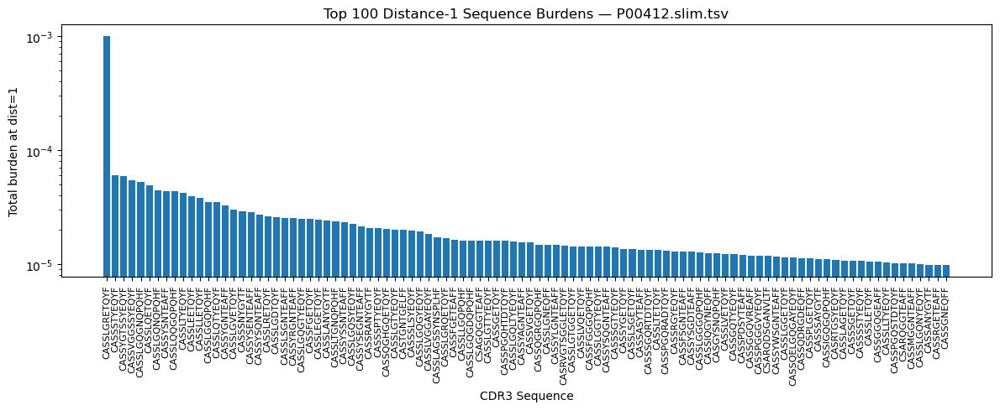

P00422.slim.tsv: max dist_1 burden = 2.70e-04, sequence = CASSLSGQPQHF


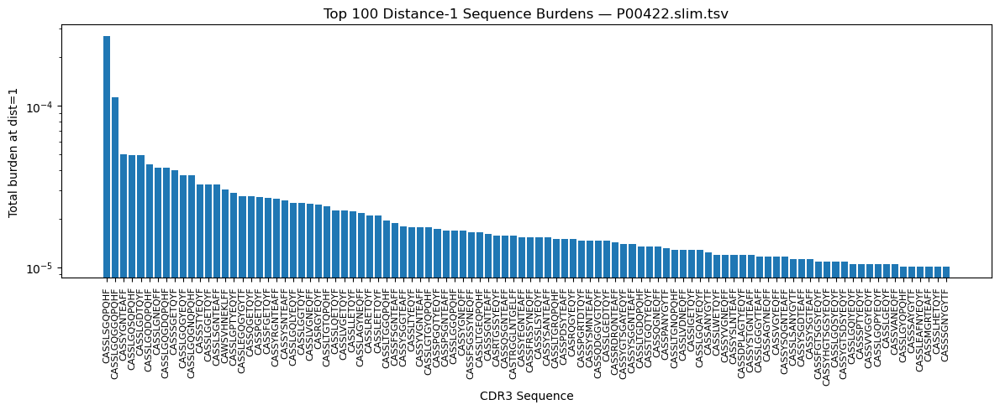

P00381.slim.tsv: max dist_1 burden = 4.26e-04, sequence = CASASANYGYTF


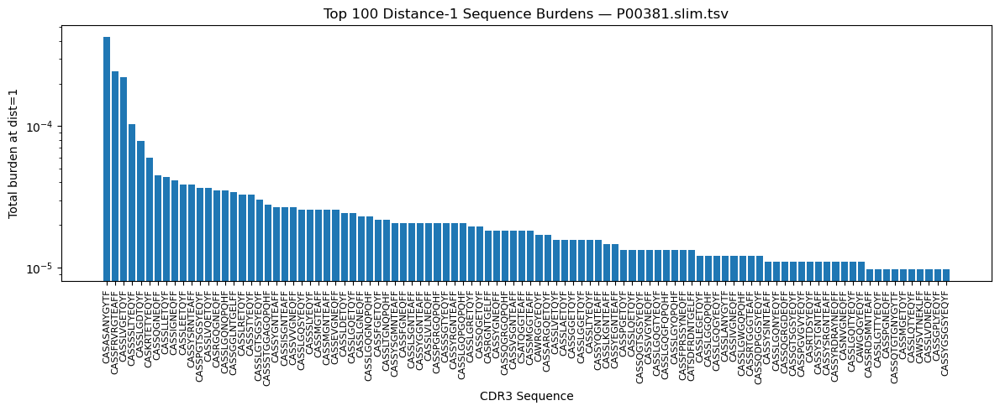

P00178.slim.tsv: max dist_1 burden = 1.35e-04, sequence = CASSYSGAYEQYF


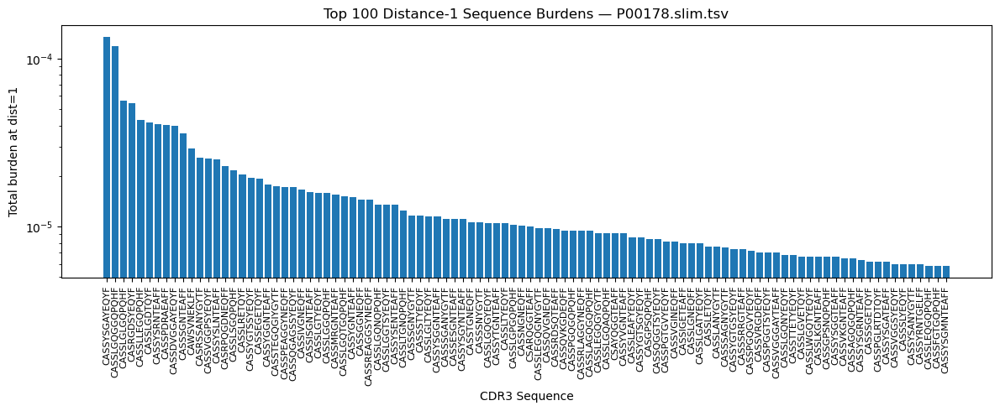

P00336.slim.tsv: max dist_1 burden = 3.43e-04, sequence = CASSLAGYNEQFF


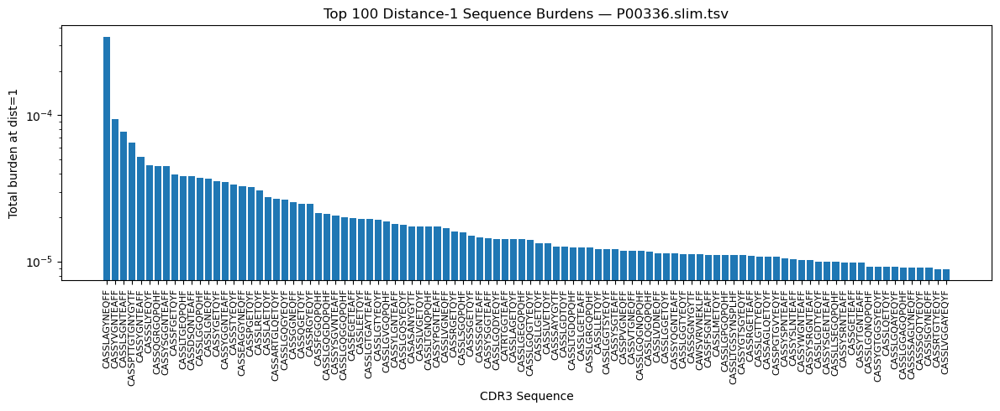

P00094.slim.tsv: max dist_1 burden = 6.81e-05, sequence = CASSLEETQYF


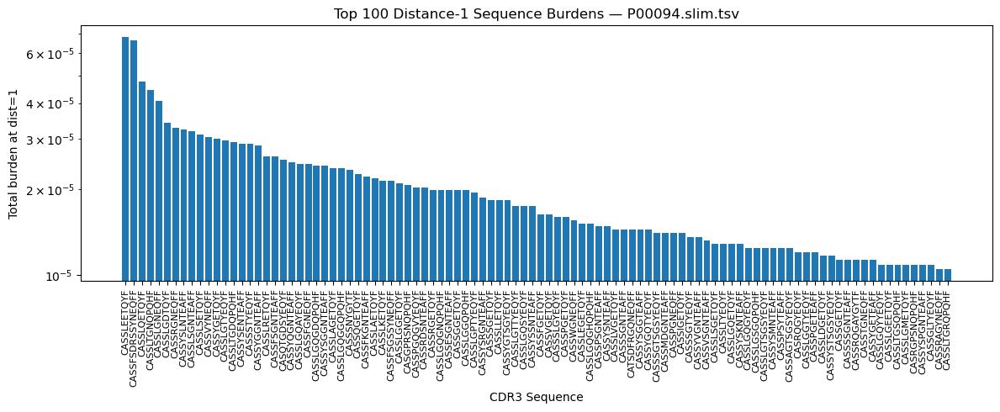

P00551.slim.tsv: max dist_1 burden = 6.51e-04, sequence = CAISVGNEQFF


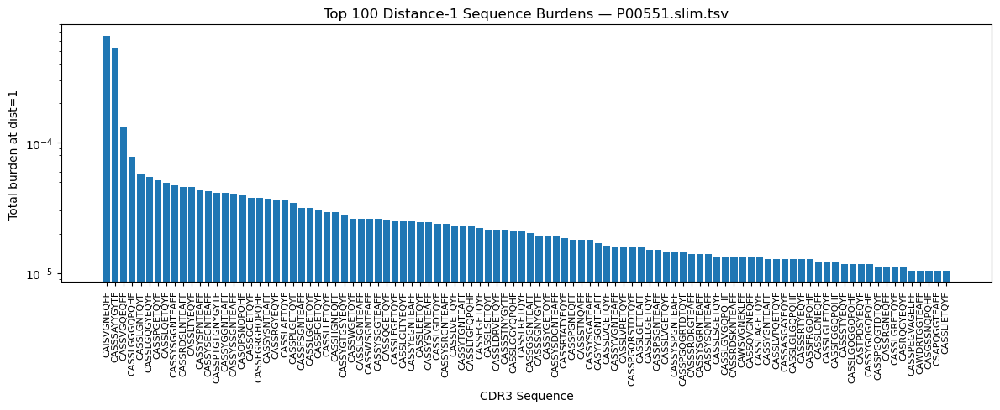

P00393.slim.tsv: max dist_1 burden = 2.99e-04, sequence = CASSLTGSQPQHF


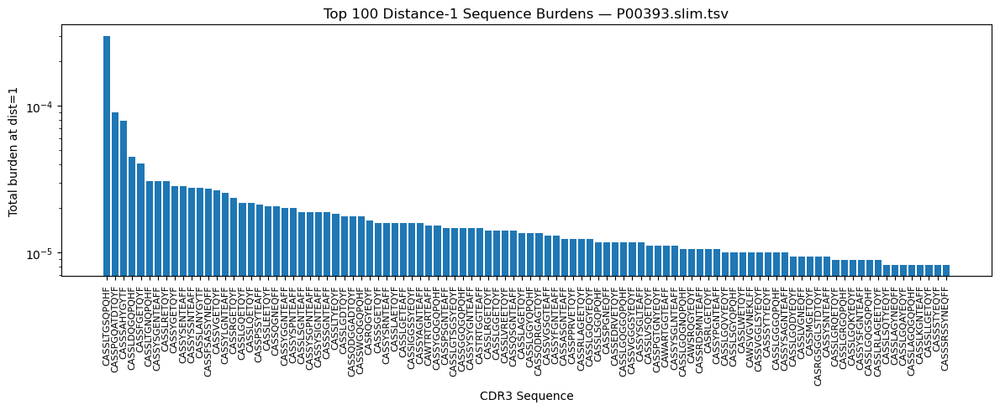

P00084.slim.tsv: max dist_1 burden = 1.33e-04, sequence = CASSRSGNTEAFF


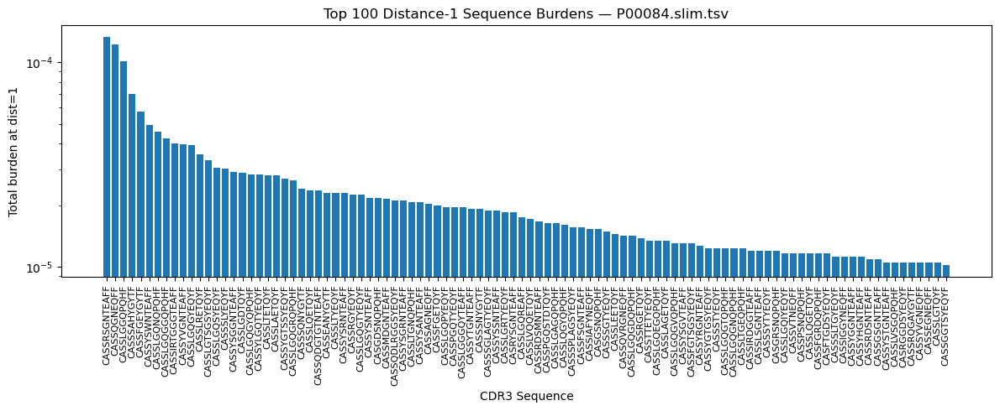

P00488.slim.tsv: max dist_1 burden = 7.77e-04, sequence = CASSLWGETQYF


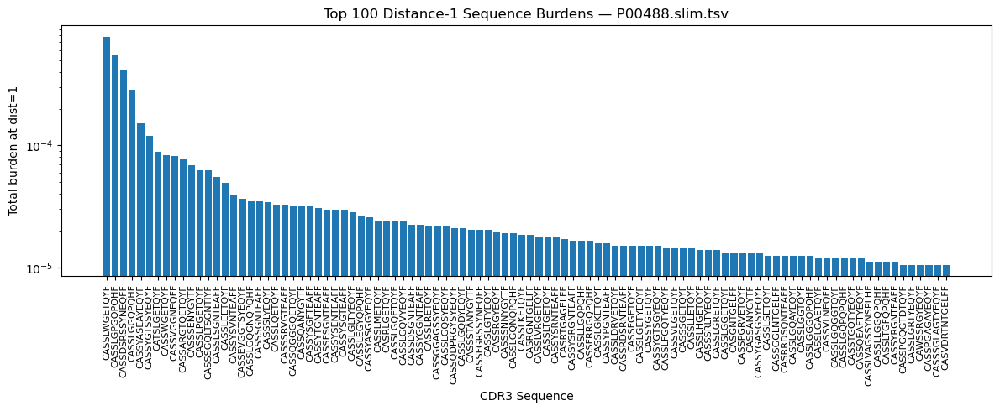

P00007.slim.tsv: max dist_1 burden = 1.04e-03, sequence = CASSYRNTGELFF


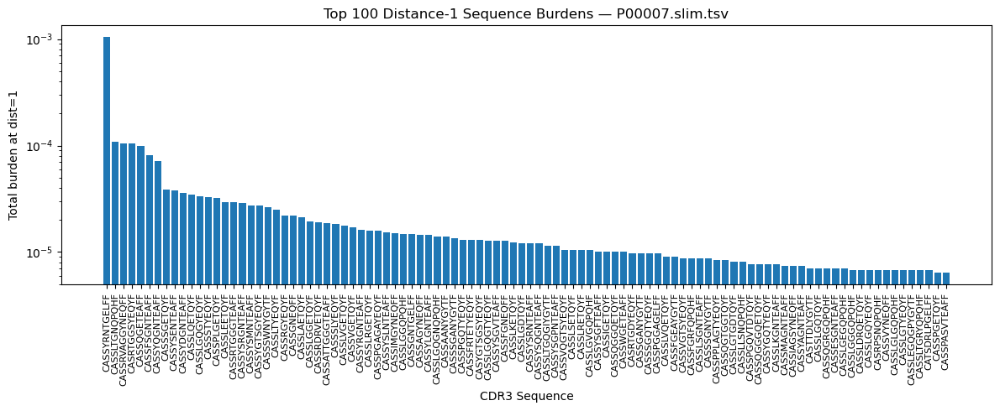

P00325.slim.tsv: max dist_1 burden = 3.36e-04, sequence = CASSFPGQRTDTQYF


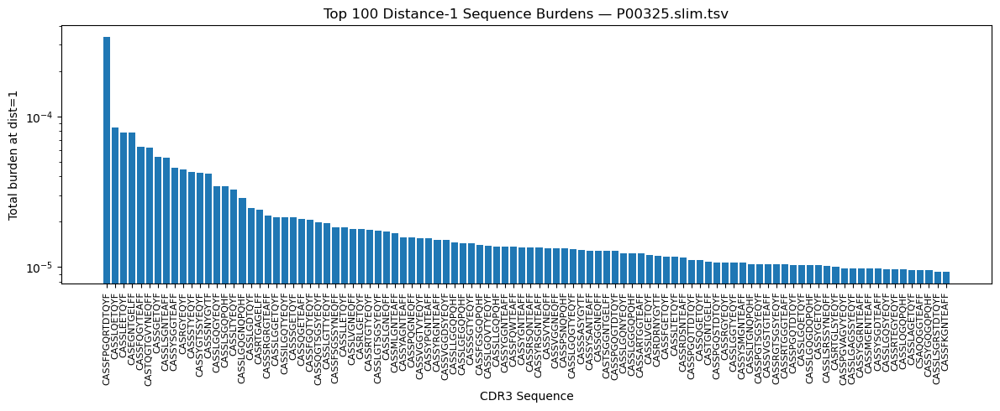

P00107.slim.tsv: max dist_1 burden = 1.05e-04, sequence = CASSMTGETEAFF


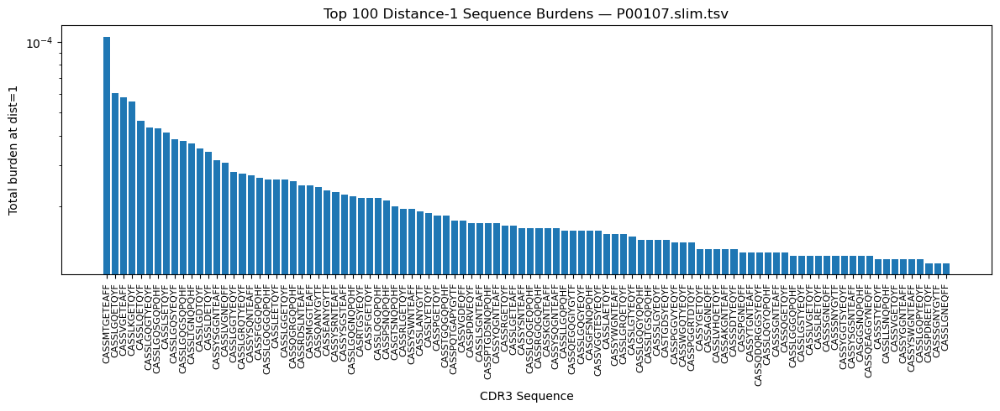

P00191.slim.tsv: max dist_1 burden = 1.62e-04, sequence = CASSPGAGGYEQYF


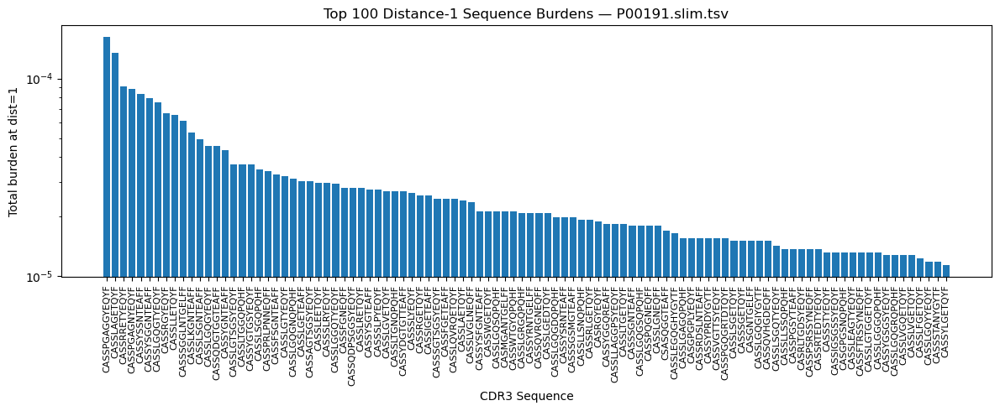

P00340.slim.tsv: max dist_1 burden = 1.75e-04, sequence = CASSYGGNTEAFF


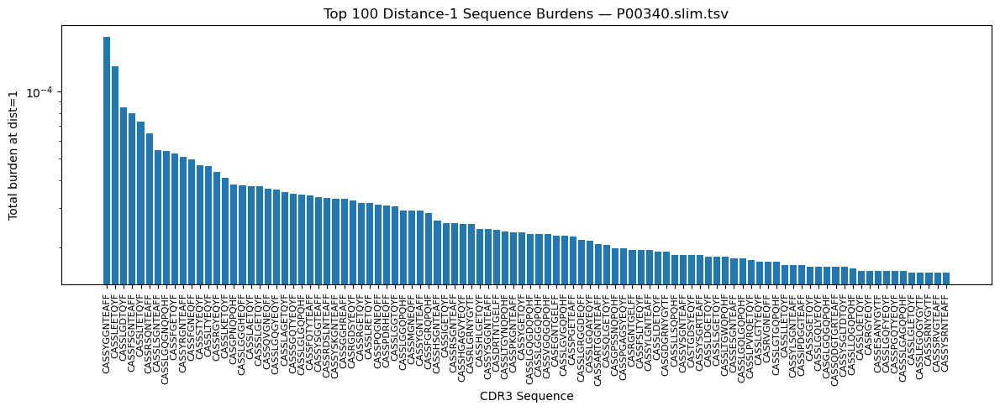

P00165.slim.tsv: max dist_1 burden = 1.29e-04, sequence = CASWTGAGELFF


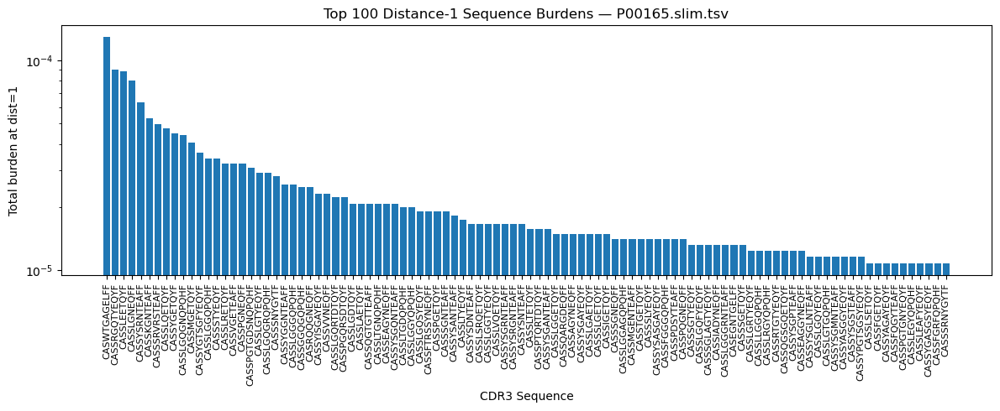

P00276.slim.tsv: max dist_1 burden = 2.22e-04, sequence = CASSIDPGGTEAFF


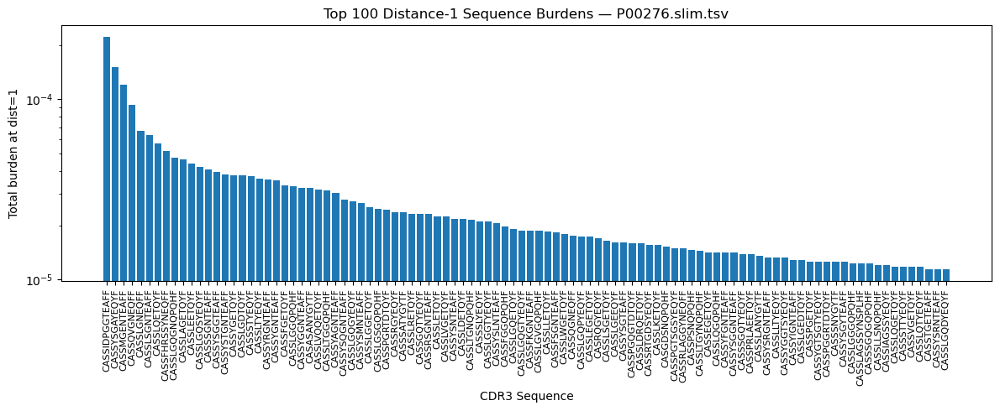

P00455.slim.tsv: max dist_1 burden = 4.73e-04, sequence = CASSFQGYTEAFF


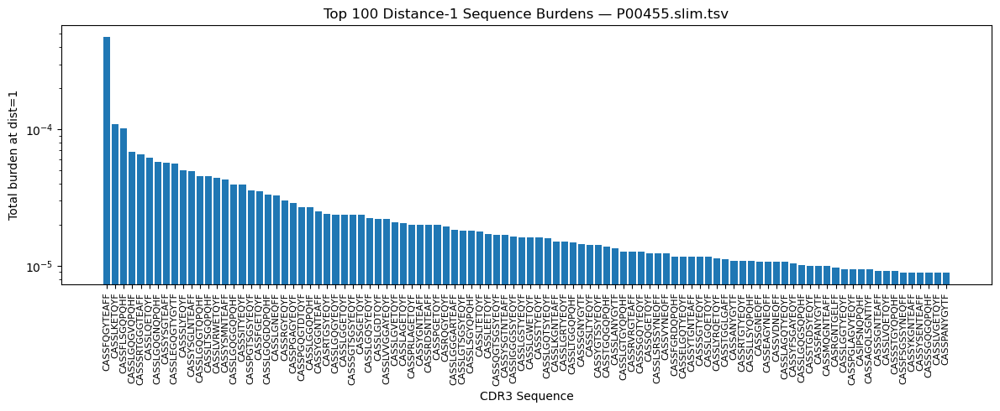

P00200.slim.tsv: max dist_1 burden = 1.25e-04, sequence = CASSLGSQGQPQHF


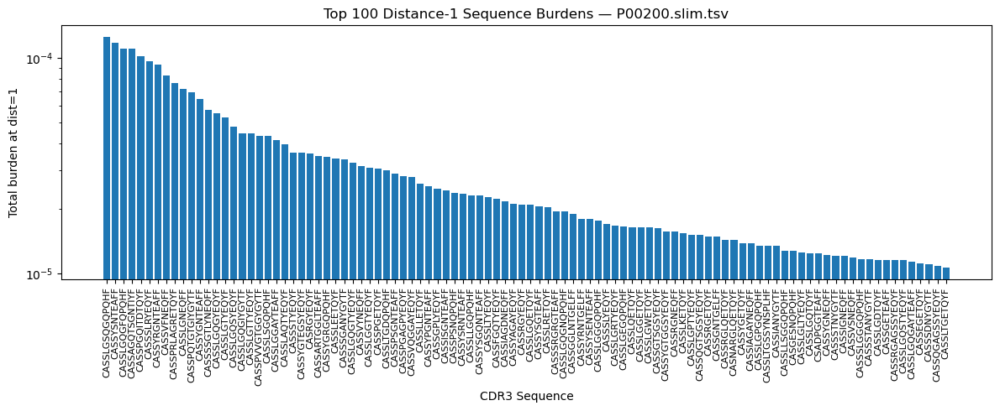

P00518.slim.tsv: max dist_1 burden = 7.94e-05, sequence = CASSYSDNTEAFF


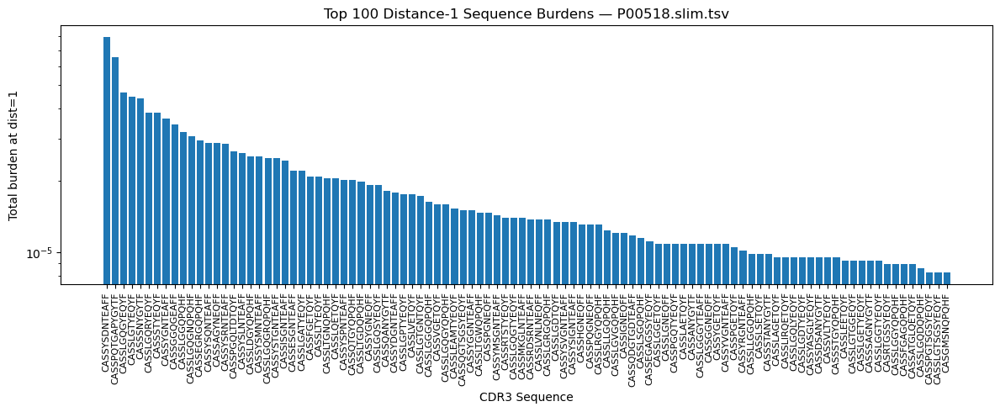

In [54]:
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict

def plot_top100_seq_burdens(contributors: dict, distance: int = 0, max_plots: int = 20):
    """
    For each patient in `contributors` (up to max_plots),
    aggregates burdens for sequences at the specified distance only,
    prints the max burden + sequence, and plots the top 100 by burden,
    labeling x-axis with the sequences themselves.

    Parameters:
        contributors (dict): Mapping of patient_id -> distance -> list of (seq, freq)
        distance (int): Levenshtein distance to consider.
        max_plots (int): Number of patients to include.
    """
    for i, (patient_id, dist_dict) in enumerate(contributors.items()):
        if i >= max_plots:
            break

        if distance not in dist_dict:
            print(f"{patient_id}: No distance-{distance} sequences, skipping.")
            continue

        seq_burden = defaultdict(float)
        for seq, freq in dist_dict[distance]:
            seq_burden[seq] += freq

        if not seq_burden:
            print(f"{patient_id}: No usable data at distance {distance}.")
            continue

        # Sort and take top 100
        sorted_seqs = sorted(seq_burden.items(), key=lambda x: x[1], reverse=True)
        top_seqs = sorted_seqs[:100]
        seqs, burdens = zip(*top_seqs)

        # Print max burden info
        max_seq, max_burden = sorted_seqs[0]
        print(f"{patient_id}: max dist_{distance} burden = {max_burden:.2e}, sequence = {max_seq}")

        # Plot with sequence labels
        plt.figure(figsize=(12, 5))
        plt.bar(seqs, burdens, width=0.8)
        plt.title(f"Top 100 Distance-{distance} Sequence Burdens — {patient_id}")
        plt.xlabel("CDR3 Sequence")
        plt.ylabel(f"Total burden at dist={distance}")
        plt.yscale('log')  # uncomment if needed
        plt.xticks(rotation=90, fontsize=8)
        plt.tight_layout()
        plt.show()
# Example usage
plot_top100_seq_burdens(contributors, distance=1, max_plots=20)

Added comments on the graphs

P00412.slim.tsv: max dist_3 burden = 1.02e-02, sequence = CASSYGESTDTQYF
P00412.slim.tsv: total burden at dist_3 = 2.41e-01


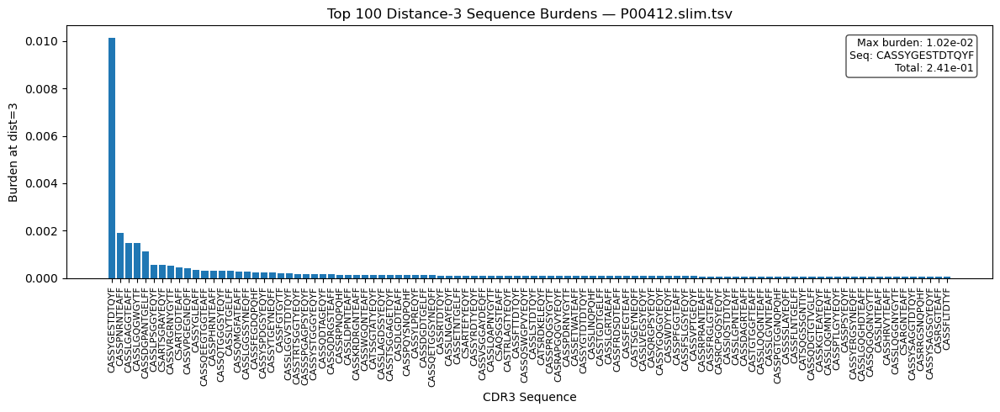

P00422.slim.tsv: max dist_3 burden = 1.30e-02, sequence = CASSYQGMSTEAFF
P00422.slim.tsv: total burden at dist_3 = 2.36e-01


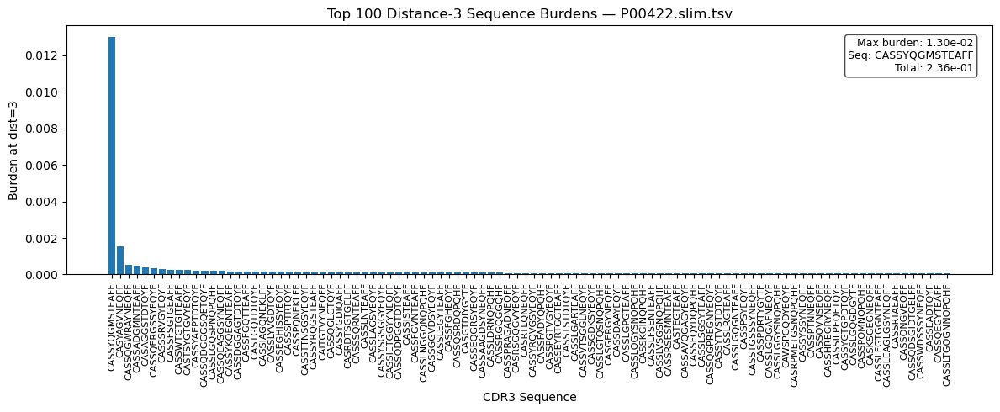

P00381.slim.tsv: max dist_3 burden = 1.09e-01, sequence = CASSLFGTGGNTEAFF
P00381.slim.tsv: total burden at dist_3 = 3.65e-01


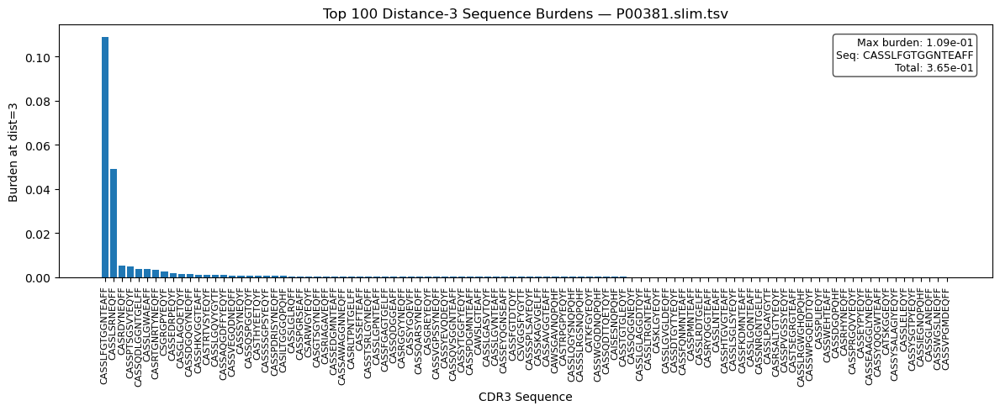

P00178.slim.tsv: max dist_3 burden = 5.96e-02, sequence = CASSLEEYSTYEQYF
P00178.slim.tsv: total burden at dist_3 = 2.52e-01


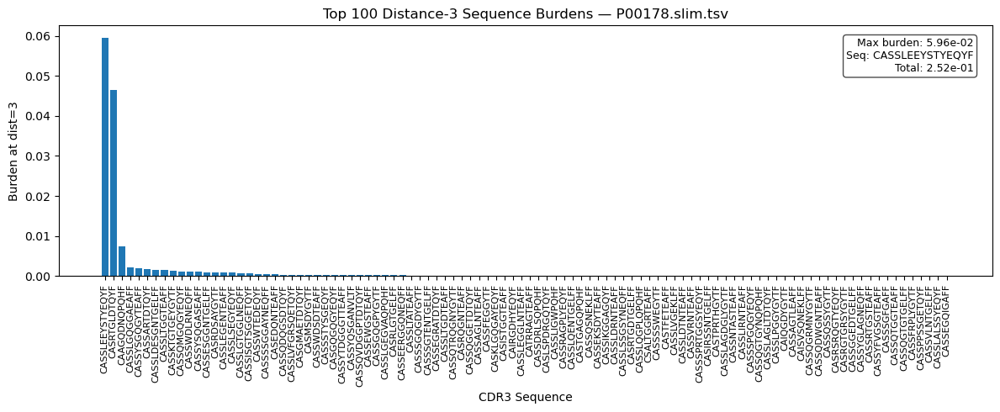

P00336.slim.tsv: max dist_3 burden = 8.18e-03, sequence = CASSGEGVLYTEAFF
P00336.slim.tsv: total burden at dist_3 = 2.02e-01


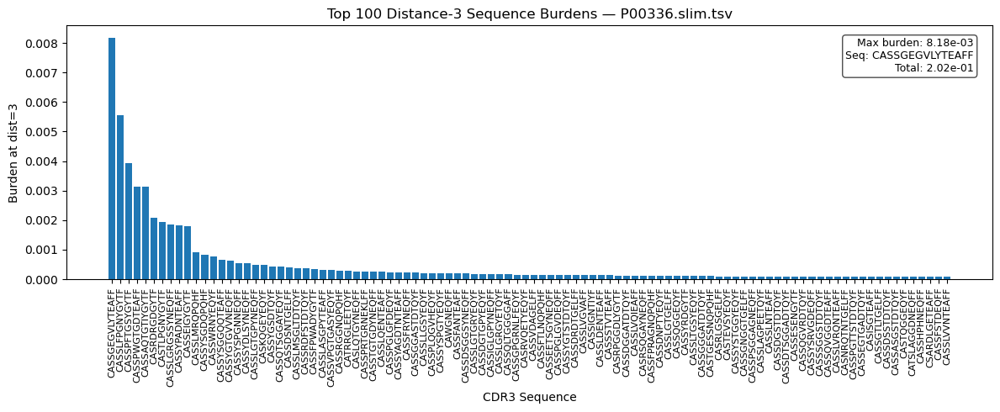

P00094.slim.tsv: max dist_3 burden = 2.47e-03, sequence = CASSPRQDTEAFF
P00094.slim.tsv: total burden at dist_3 = 2.44e-01


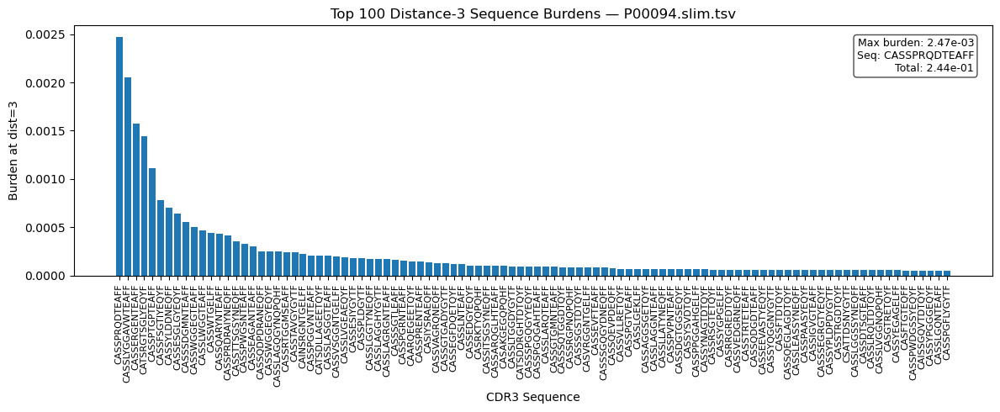

P00551.slim.tsv: max dist_3 burden = 2.96e-02, sequence = CAISQGNEQYF
P00551.slim.tsv: total burden at dist_3 = 2.45e-01


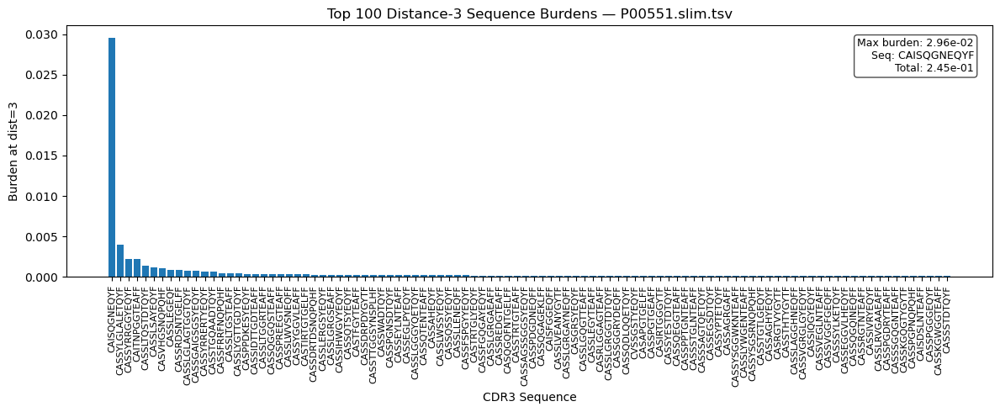

P00393.slim.tsv: max dist_3 burden = 2.37e-02, sequence = CASSGYYGYTF
P00393.slim.tsv: total burden at dist_3 = 2.48e-01


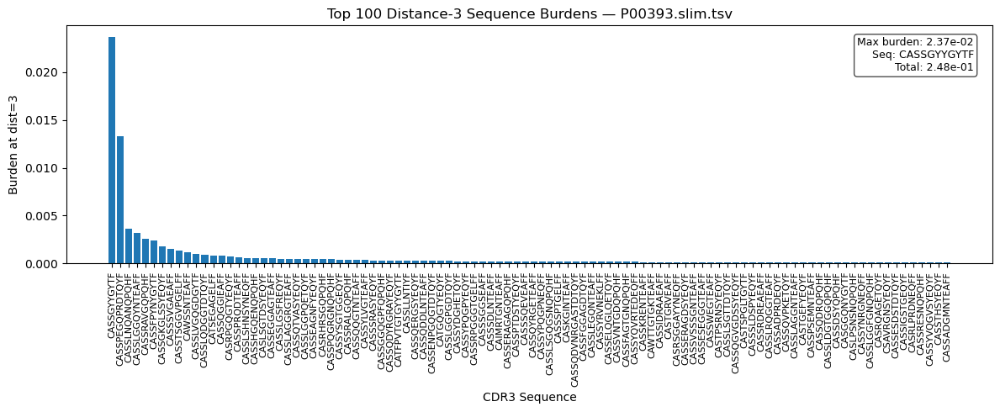

P00084.slim.tsv: max dist_3 burden = 1.06e-02, sequence = CASGRTGGDLYEQYF
P00084.slim.tsv: total burden at dist_3 = 2.51e-01


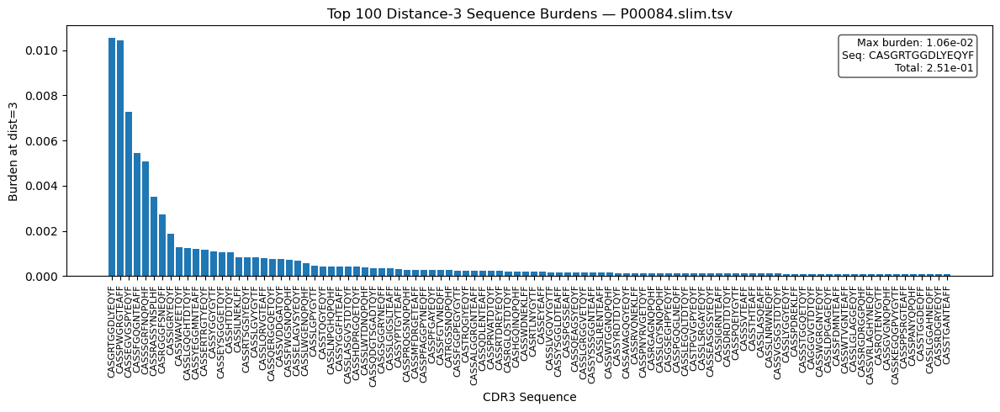

P00488.slim.tsv: max dist_3 burden = 3.37e-03, sequence = CASITGTSNTGELFF
P00488.slim.tsv: total burden at dist_3 = 2.24e-01


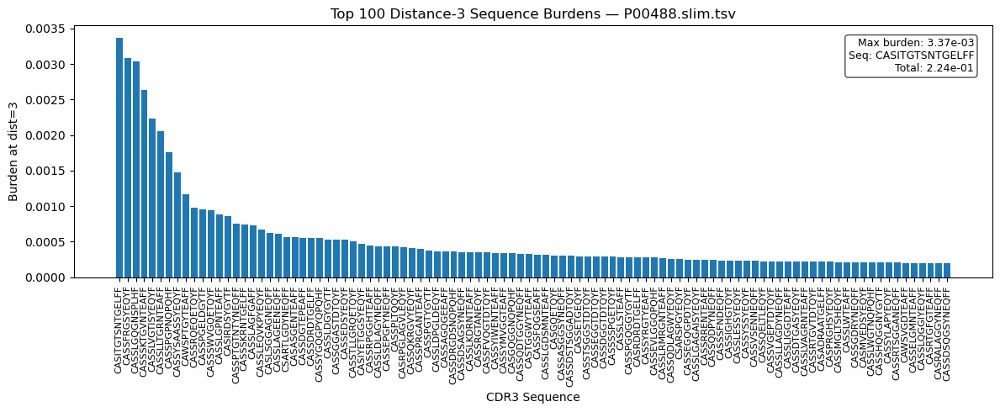

P00007.slim.tsv: max dist_3 burden = 1.49e-02, sequence = CASSTGQGTEAFF
P00007.slim.tsv: total burden at dist_3 = 2.23e-01


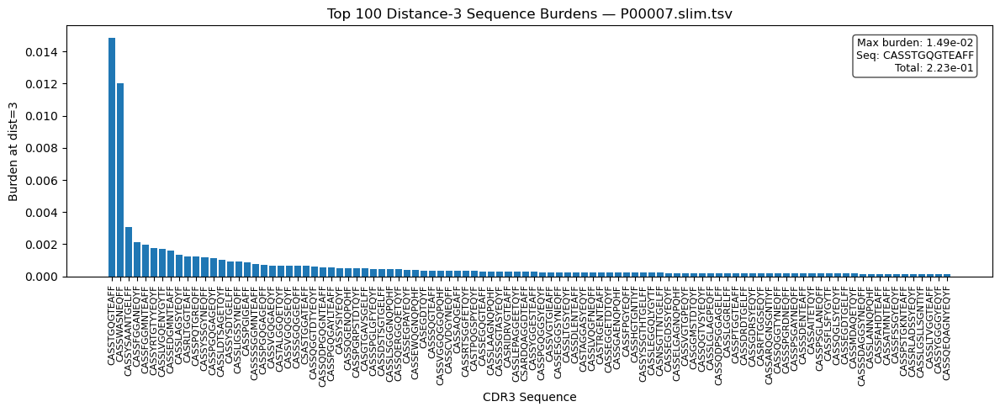

P00325.slim.tsv: max dist_3 burden = 3.85e-03, sequence = CASSYVVAGGYEQYF
P00325.slim.tsv: total burden at dist_3 = 2.29e-01


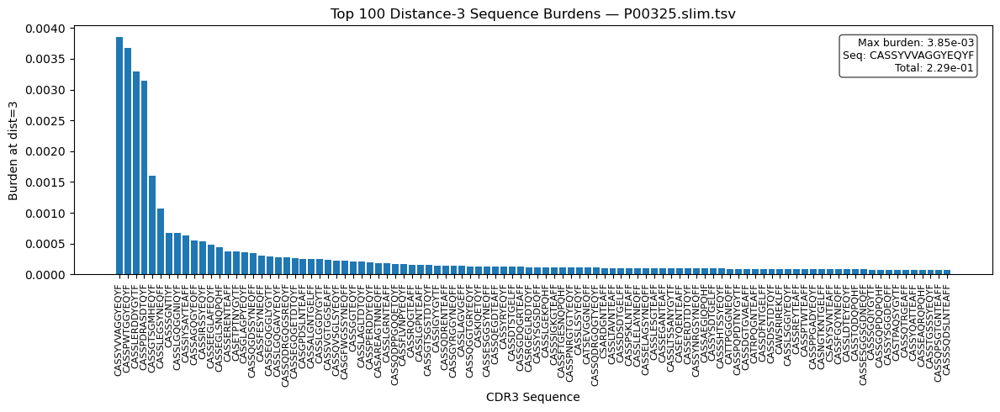

P00107.slim.tsv: max dist_3 burden = 5.64e-03, sequence = CASSSDSAYEQYF
P00107.slim.tsv: total burden at dist_3 = 2.29e-01


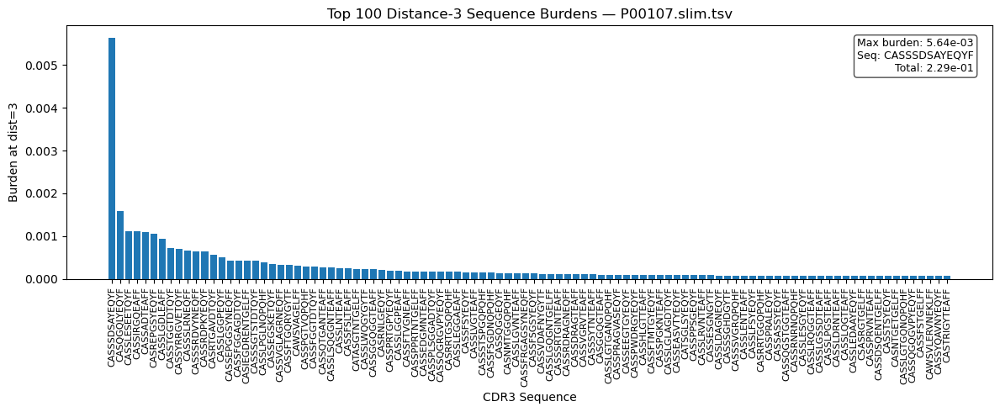

P00191.slim.tsv: max dist_3 burden = 1.21e-02, sequence = CASSLFGSGGNTEAFF
P00191.slim.tsv: total burden at dist_3 = 2.29e-01


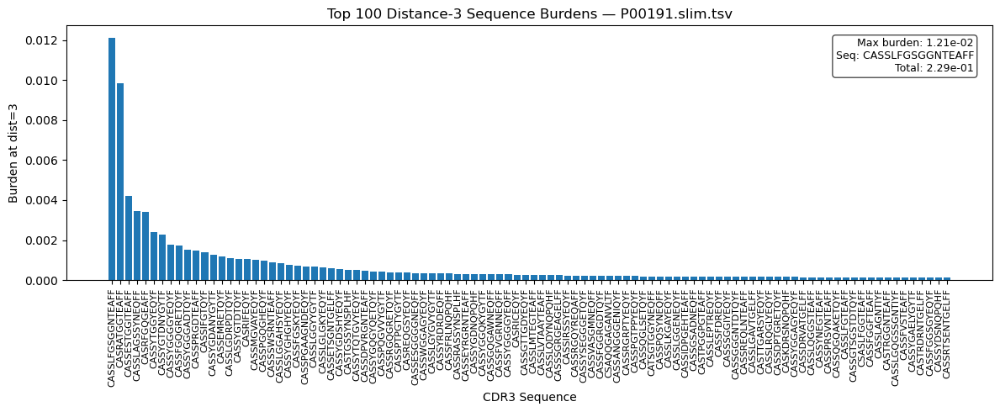

P00340.slim.tsv: max dist_3 burden = 1.44e-03, sequence = CASSLGSTGELFF
P00340.slim.tsv: total burden at dist_3 = 2.35e-01


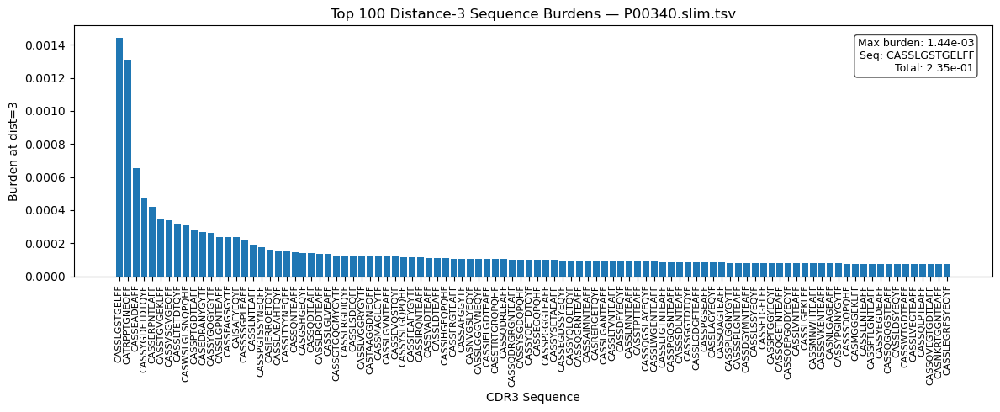

P00165.slim.tsv: max dist_3 burden = 9.61e-03, sequence = CASSPPSQETQYF
P00165.slim.tsv: total burden at dist_3 = 2.43e-01


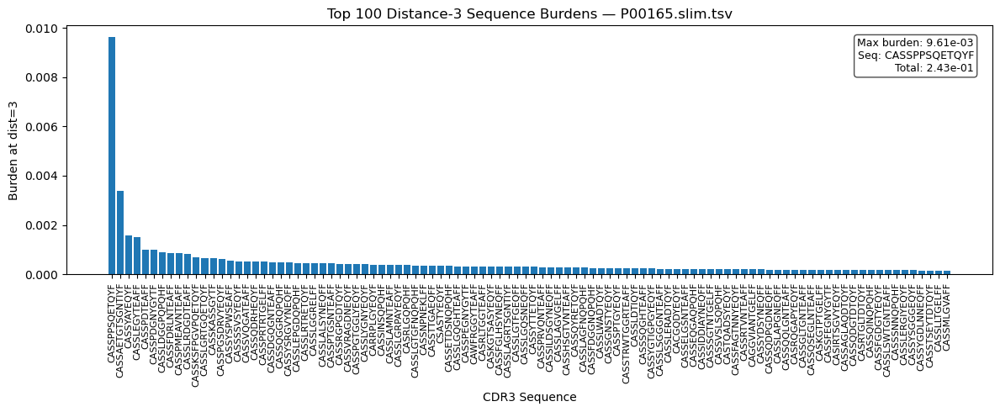

P00276.slim.tsv: max dist_3 burden = 7.22e-03, sequence = CASSPSGQAYNEQFF
P00276.slim.tsv: total burden at dist_3 = 2.83e-01


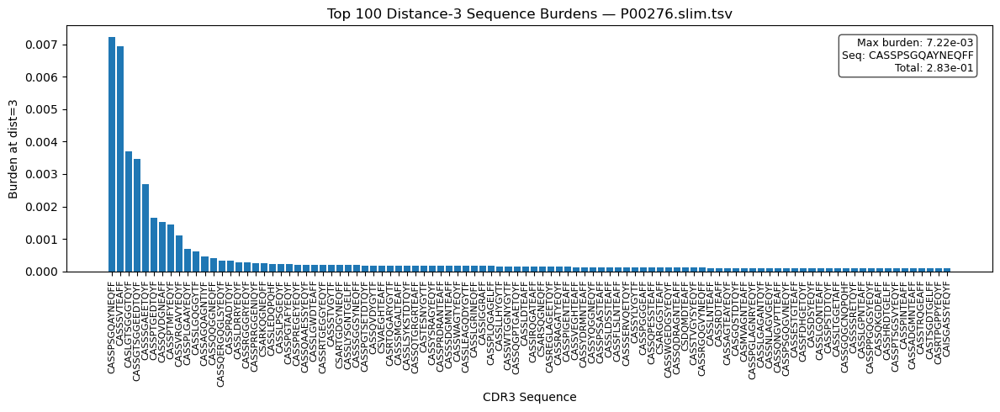

P00455.slim.tsv: max dist_3 burden = 5.99e-03, sequence = CASSATNLNEQFF
P00455.slim.tsv: total burden at dist_3 = 2.26e-01


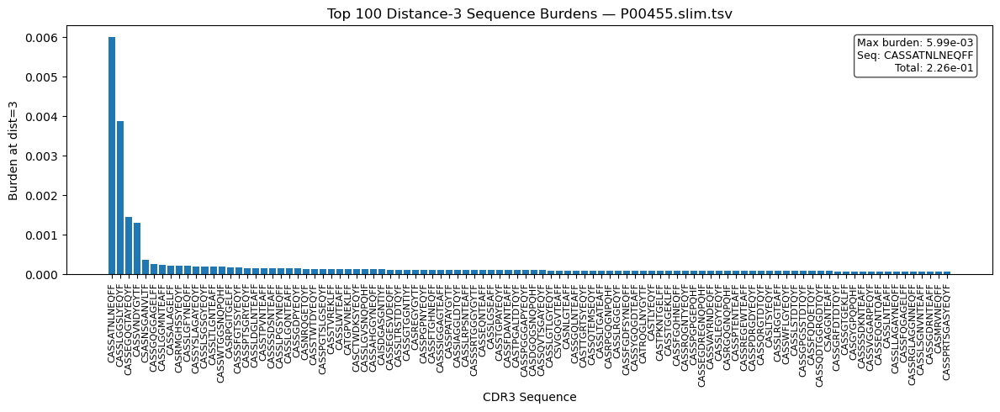

P00200.slim.tsv: max dist_3 burden = 7.14e-03, sequence = CASSEGTGTEAFF
P00200.slim.tsv: total burden at dist_3 = 2.35e-01


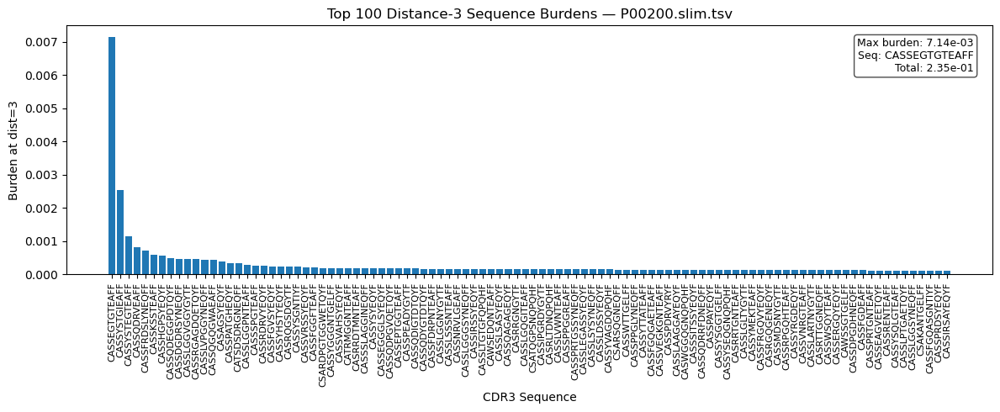

P00518.slim.tsv: max dist_3 burden = 1.65e-02, sequence = CASSFLGTDSYEQYF
P00518.slim.tsv: total burden at dist_3 = 2.45e-01


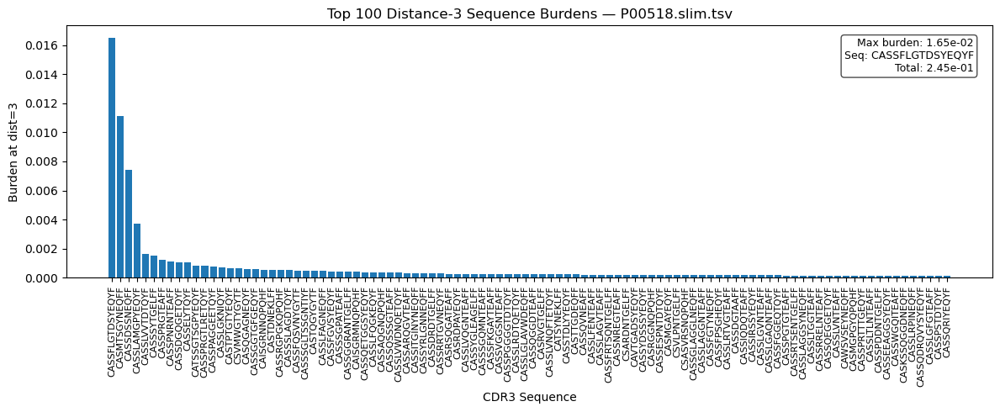

In [59]:
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict

def plot_top100_seq_burdens(contributors: dict, distance: int = 0, max_plots: int = 20):
    """
    For each patient in `contributors` (up to max_plots),
    aggregates burdens for sequences at the specified distance only,
    prints the max burden + sequence, and plots the top 100 by burden,
    labeling x-axis with the sequences themselves, and annotating:
      • max burden & its sequence
      • total burden at that distance
    """
    for i, (patient_id, dist_dict) in enumerate(contributors.items()):
        if i >= max_plots:
            break

        if distance not in dist_dict:
            print(f"{patient_id}: No distance-{distance} sequences, skipping.")
            continue

        # aggregate burdens
        seq_burden = defaultdict(float)
        for seq, freq in dist_dict[distance]:
            seq_burden[seq] += freq

        if not seq_burden:
            print(f"{patient_id}: No usable data at distance {distance}.")
            continue

        # Sort and take top 100
        sorted_seqs = sorted(seq_burden.items(), key=lambda x: x[1], reverse=True)
        top_seqs = sorted_seqs[:100]
        seqs, burdens = zip(*top_seqs)

        # Compute stats
        max_seq, max_burden = sorted_seqs[0]
        total_burden = sum(seq_burden.values())

        # Print to console
        print(f"{patient_id}: max dist_{distance} burden = {max_burden:.2e}, sequence = {max_seq}")
        print(f"{patient_id}: total burden at dist_{distance} = {total_burden:.2e}")

        # Plot
        plt.figure(figsize=(12, 5))
        bars = plt.bar(seqs, burdens, width=0.8)
        plt.title(f"Top 100 Distance-{distance} Sequence Burdens — {patient_id}")
        plt.xlabel("CDR3 Sequence")
        plt.ylabel(f"Burden at dist={distance}")
        plt.xticks(rotation=90, fontsize=8)

        # Annotate text in upper right
        text = (
            f"Max burden: {max_burden:.2e}\n"
            f"Seq: {max_seq}\n"
            f"Total: {total_burden:.2e}"
        )
        plt.gca().text(
            0.98, 0.95, text,
            transform=plt.gca().transAxes,
            ha='right', va='top',
            fontsize=9,
            bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.7)
        )

        plt.tight_layout()
        plt.show()

# Example usage
plot_top100_seq_burdens(contributors, distance=3, max_plots=20)

P00412.slim.tsv: max dist_0 burden = 4.35e-03, sequence = CASSYSGNTEAFF
P00422.slim.tsv: max dist_0 burden = 4.40e-04, sequence = CASSLGETQYF
P00381.slim.tsv: max dist_0 burden = 7.69e-03, sequence = CASSSANYGYTF
P00178.slim.tsv: max dist_0 burden = 2.08e-02, sequence = CASSLGETQYF
P00336.slim.tsv: max dist_0 burden = 3.53e-04, sequence = CASSSANYGYTF
P00094.slim.tsv: max dist_0 burden = 1.79e-03, sequence = CASSSANYGYTF
P00551.slim.tsv: max dist_0 burden = 1.60e-03, sequence = CASSSANYGYTF
P00393.slim.tsv: max dist_0 burden = 5.29e-03, sequence = CASSLGETQYF
P00084.slim.tsv: max dist_0 burden = 1.27e-03, sequence = CASSLGETQYF
P00488.slim.tsv: max dist_0 burden = 5.11e-04, sequence = CASSFSRSSYNEQFF
P00007.slim.tsv: max dist_0 burden = 7.25e-04, sequence = CASTSGGLNTGELFF
P00325.slim.tsv: max dist_0 burden = 2.64e-03, sequence = CASSSANYGYTF
P00107.slim.tsv: max dist_0 burden = 5.34e-04, sequence = CATSVGANTGELFF
P00191.slim.tsv: max dist_0 burden = 4.31e-04, sequence = CASSSLTYEQYF
P

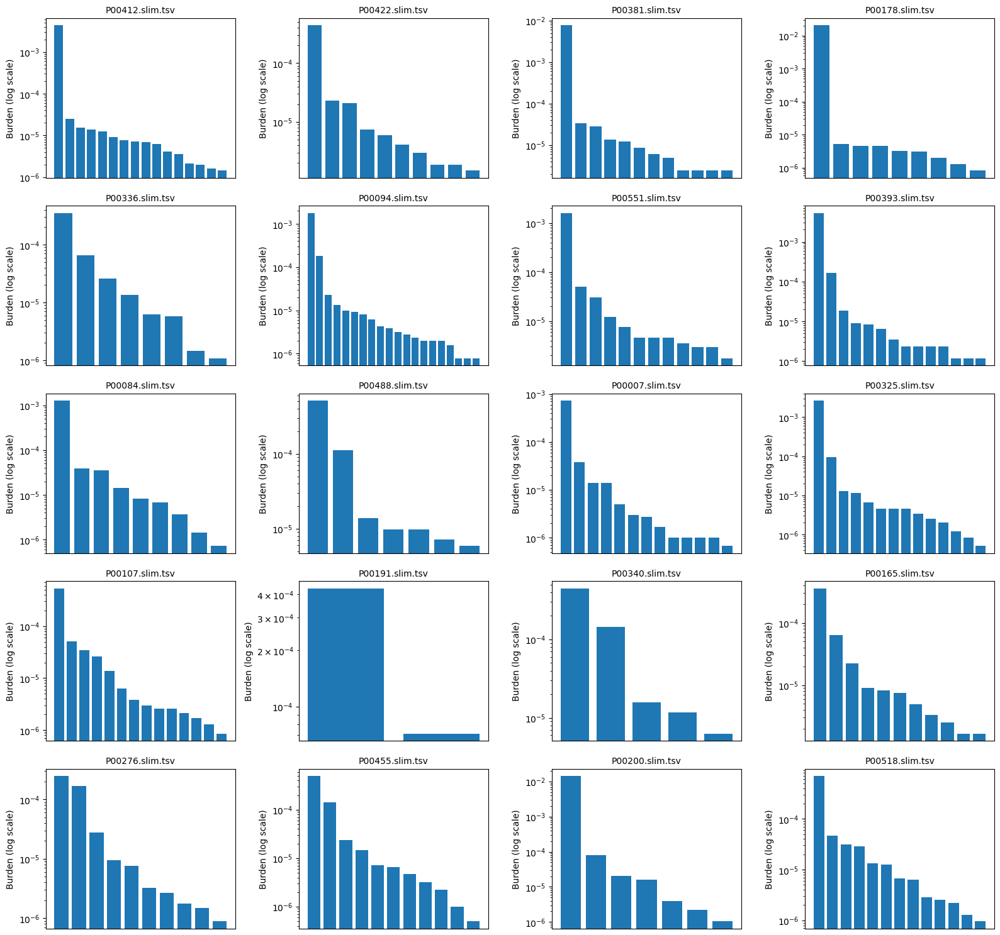

In [48]:
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict
import math

def plot_top100_dist0_seq_burdens(contributors: dict, max_plots: int = 20, cols: int = 4, log_scale: bool = False):
    """
    For each patient in `contributors` (up to max_plots),
    aggregates burdens for sequences at distance 0 only,
    prints the max burden + sequence, and plots the top 100 by burden
    in a grid of subplots.

    Parameters:
        contributors (dict): Patient data.
        max_plots (int): Max number of patients to plot.
        cols (int): Number of columns in the subplot grid.
        log_scale (bool): Whether to use log scale on the y-axis.
    """
    # Determine grid size
    n_plots = min(len(contributors), max_plots)
    rows = math.ceil(n_plots / cols)

    fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 3), squeeze=False)
    axes_flat = axes.flatten()

    for ax, (i, (patient_id, dist_dict)) in zip(axes_flat, enumerate(contributors.items())):
        if i >= max_plots:
            break

        if 0 not in dist_dict:
            ax.set_title(f"{patient_id}\n(no dist-0 data)")
            ax.axis('off')
            continue

        # Aggregate
        seq_burden = defaultdict(float)
        for seq, freq in dist_dict[0]:
            seq_burden[seq] += freq

        if not seq_burden:
            ax.set_title(f"{patient_id}\n(no usable data)")
            ax.axis('off')
            continue

        # Top 100
        sorted_seqs = sorted(seq_burden.items(), key=lambda x: x[1], reverse=True)
        top_seqs = sorted_seqs[:100]
        seqs, burdens = zip(*top_seqs)

        # Print max
        max_seq, max_burden = sorted_seqs[0]
        print(f"{patient_id}: max dist_0 burden = {max_burden:.2e}, sequence = {max_seq}")

        # Plot
        ax.bar(seqs, burdens, width=0.8)
        ax.set_title(patient_id, fontsize=10)
        if log_scale:
            ax.set_yscale('log')
        ax.set_xticks([])
        ax.set_ylabel("Burden" + (" (log scale)" if log_scale else ""))

    # Hide any extra axes
    for j in range(n_plots, rows * cols):
        axes_flat[j].axis('off')

    plt.tight_layout()
    plt.show()
plot_top100_dist0_seq_burdens(contributors, max_plots=20, cols=4, log_scale=True)

P00412.slim.tsv: max dist_1 burden = 1.00e-03, sequence = CASSLGRETQYF
P00422.slim.tsv: max dist_1 burden = 2.70e-04, sequence = CASSLSGQPQHF
P00381.slim.tsv: max dist_1 burden = 4.26e-04, sequence = CASASANYGYTF
P00178.slim.tsv: max dist_1 burden = 1.35e-04, sequence = CASSYSGAYEQYF
P00336.slim.tsv: max dist_1 burden = 3.43e-04, sequence = CASSLAGYNEQFF
P00094.slim.tsv: max dist_1 burden = 6.81e-05, sequence = CASSLEETQYF
P00551.slim.tsv: max dist_1 burden = 6.51e-04, sequence = CAISVGNEQFF
P00393.slim.tsv: max dist_1 burden = 2.99e-04, sequence = CASSLTGSQPQHF
P00084.slim.tsv: max dist_1 burden = 1.33e-04, sequence = CASSRSGNTEAFF
P00488.slim.tsv: max dist_1 burden = 7.77e-04, sequence = CASSLWGETQYF
P00007.slim.tsv: max dist_1 burden = 1.04e-03, sequence = CASSYRNTGELFF
P00325.slim.tsv: max dist_1 burden = 3.36e-04, sequence = CASSFPGQRTDTQYF
P00107.slim.tsv: max dist_1 burden = 1.05e-04, sequence = CASSMTGETEAFF
P00191.slim.tsv: max dist_1 burden = 1.62e-04, sequence = CASSPGAGGYEQ

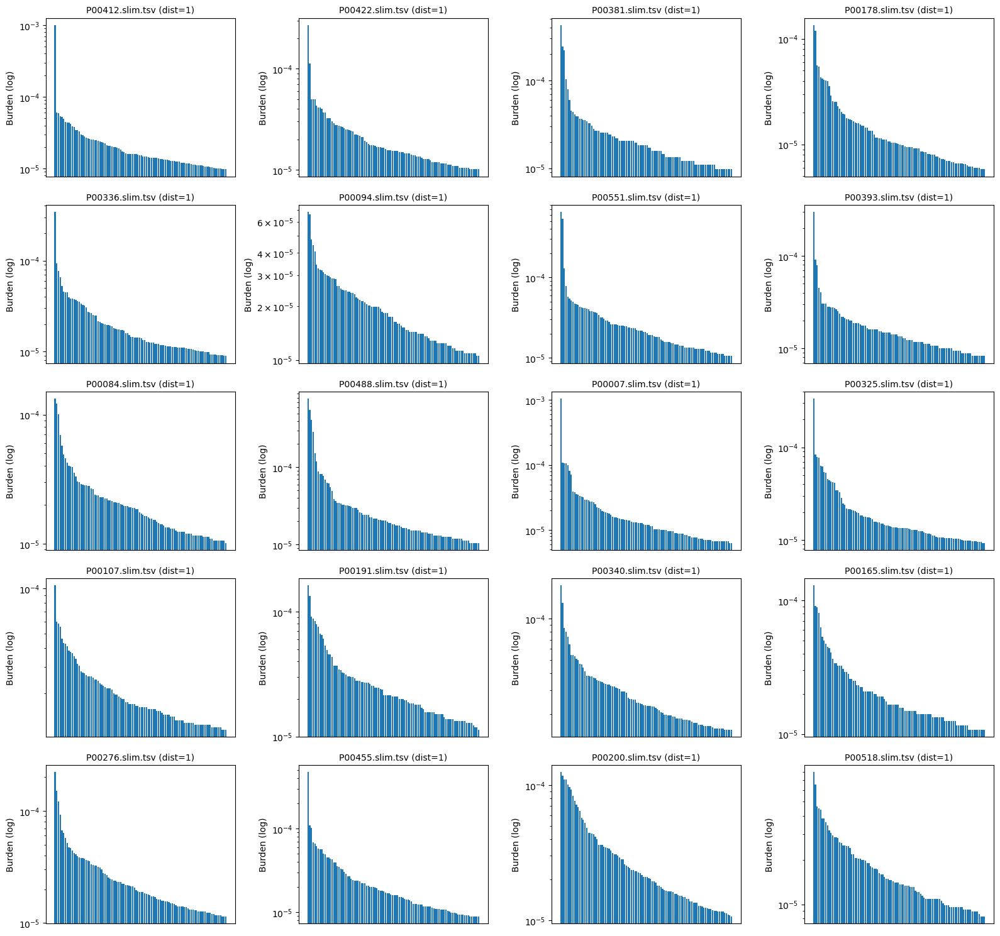

In [51]:
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict
import math

def plot_topN_seq_burdens(contributors: dict, distance: int = 0, max_plots: int = 20, cols: int = 4, log_scale: bool = False, top_n: int = 100):
    """
    For each patient in `contributors` (up to max_plots),
    aggregates burdens for sequences at a specified edit distance,
    prints the max burden + sequence, and plots the top N by burden
    in a grid of subplots.

    Parameters:
        contributors (dict): Patient data.
        distance (int): Levenshtein distance to consider.
        max_plots (int): Max number of patients to plot.
        cols (int): Number of columns in the subplot grid.
        log_scale (bool): Whether to use log scale on the y-axis.
        top_n (int): Number of top sequences to plot.
    """
    # Determine grid size
    n_plots = min(len(contributors), max_plots)
    rows = math.ceil(n_plots / cols)

    fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 3), squeeze=False)
    axes_flat = axes.flatten()

    for ax, (i, (patient_id, dist_dict)) in zip(axes_flat, enumerate(contributors.items())):
        if i >= max_plots:
            break

        if distance not in dist_dict:
            ax.set_title(f"{patient_id}\n(no dist-{distance} data)")
            ax.axis('off')
            continue

        # Aggregate
        seq_burden = defaultdict(float)
        for seq, freq in dist_dict[distance]:
            seq_burden[seq] += freq

        if not seq_burden:
            ax.set_title(f"{patient_id}\n(no usable data)")
            ax.axis('off')
            continue

        # Top N
        sorted_seqs = sorted(seq_burden.items(), key=lambda x: x[1], reverse=True)
        top_seqs = sorted_seqs[:top_n]
        seqs, burdens = zip(*top_seqs)

        # Print max
        max_seq, max_burden = sorted_seqs[0]
        print(f"{patient_id}: max dist_{distance} burden = {max_burden:.2e}, sequence = {max_seq}")

        # Plot
        ax.bar(seqs, burdens, width=0.8)
        ax.set_title(f"{patient_id} (dist={distance})", fontsize=10)
        if log_scale:
            ax.set_yscale('log')
        ax.set_xticks([])
        ax.set_ylabel("Burden" + (" (log)" if log_scale else ""))

    # Hide any extra axes
    for j in range(n_plots, rows * cols):
        axes_flat[j].axis('off')

    plt.tight_layout()
    plt.show()

plot_topN_seq_burdens(contributors, distance=1, max_plots=20, cols=4, log_scale=True, top_n=100)

In [39]:
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict
import math

def plot_top100_dist0_seq_burdens(contributors: dict, max_plots: int = 20):
    """
    For each patient in `contributors` (up to max_plots),
    aggregates burdens for sequences at distance 0 only,
    prints the max burden + sequence, and plots the top 100 by burden
    on a single grid of subplots.
    """
    # Prepare data first
    plot_data = []
    for i, (patient_id, dist_dict) in enumerate(contributors.items()):
        if i >= max_plots:
            break
        if 0 not in dist_dict:
            print(f"{patient_id}: No distance-0 sequences, skipping.")
            continue

        seq_burden = defaultdict(float)
        for seq, freq in dist_dict[0]:
            seq_burden[seq] += freq

        if not seq_burden:
            print(f"{patient_id}: No usable data at distance 0.")
            continue

        sorted_seqs = sorted(seq_burden.items(), key=lambda x: x[1], reverse=True)
        top_seqs = sorted_seqs[:100]
        seqs, burdens = zip(*top_seqs)

        max_seq, max_burden = sorted_seqs[0]
        print(f"{patient_id}: max dist_0 burden = {max_burden:.2e}, sequence = {max_seq}")

        plot_data.append((patient_id, seqs, burdens))

    # Determine grid size
    n_plots = len(plot_data)
    n_cols = 2
    n_rows = math.ceil(n_plots / n_cols)

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, 5 * n_rows), constrained_layout=True)
    axes = axes.flatten()

    for ax, (patient_id, seqs, burdens) in zip(axes, plot_data):
        ax.bar(seqs, burdens, width=0.8)
        ax.set_title(f"{patient_id}")
        ax.set_xlabel("CDR3 Sequence")
        ax.set_ylabel("Burden")
        ax.set_yscale('log')
        ax.tick_params(axis='x', rotation=90, labelsize=6)

    # Hide any unused axes
    for ax in axes[n_plots:]:
        ax.axis("off")

    fig.suptitle("Top 100 Distance-0 Sequence Burdens per Patient", fontsize=16)
    plt.show()


In [16]:
print_dist0_seq_burdens(contributors, max_patients=5)



P00412.slim.tsv — Distance 0 Sequences (sorted by total burden):
  CASSYSGNTEAFF: 4.35e-03
  CASSLGETQYF: 2.46e-05
  CASSARTGGGTEAFF: 1.54e-05
  CASSSANYGYTF: 1.37e-05
  CASSLGQTYEQYF: 1.23e-05
  CASSLGQGQPQHF: 9.22e-06
  CASSPRLAGEETQYF: 7.59e-06
  CASSSLTYEQYF: 7.23e-06
  CASSLEGQGIYGYTF: 7.05e-06
  CASSLTGYQPQHF: 6.33e-06
  CAWRQGYEQYF: 4.16e-06
  CASSSLGGAGQPQHF: 3.62e-06
  CASSSRVRGTEAFF: 2.17e-06
  CASSVGGTSYEQYF: 1.99e-06
  CASSLGGGAYTEAFF: 1.63e-06
  CASSQVRGDEQFF: 1.45e-06

P00422.slim.tsv — Distance 0 Sequences (sorted by total burden):
  CASSLGETQYF: 4.40e-04
  CASSLGQGQPQHF: 2.28e-05
  CASSSANYGYTF: 2.09e-05
  CAWSRGYEQYF: 7.48e-06
  CASSLTGYQPQHF: 5.99e-06
  CASSVGNEQFF: 4.12e-06
  CASSIAGYNEQFF: 2.99e-06
  CASSYGTSGSYEQYF: 1.87e-06
  CASSSLTYEQYF: 1.87e-06
  CASSARTGGGTEAFF: 1.50e-06

P00381.slim.tsv — Distance 0 Sequences (sorted by total burden):
  CASSSANYGYTF: 7.69e-03
  CASSLGETQYF: 3.40e-05
  CASSLGQTYEQYF: 2.79e-05
  CASSLGQGQPQHF: 1.34e-05
  CAWSVVNEKLFF: 1.21e-0

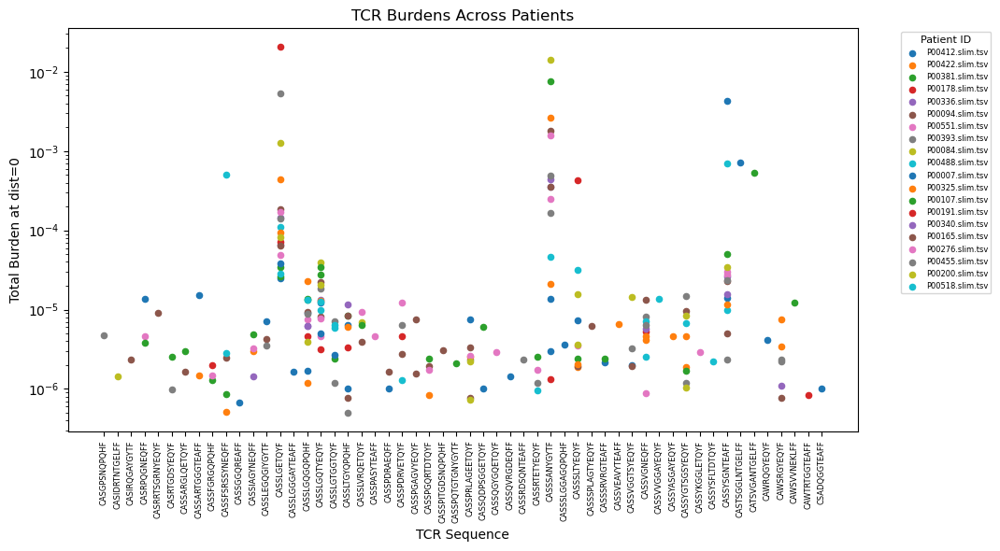

In [18]:
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict

def plot_burden_across_patients(contributors: dict):
    """
    Plots the burden at distance 0 for each TCR sequence (x-axis)
    and each patient (colored points).
    """
    # 1. Aggregate burdens per patient
    patient_seq_burdens = {}
    all_seqs = set()
    for patient_id, dist_dict in contributors.items():
        if 0 not in dist_dict:
            continue
        seq_burden = defaultdict(float)
        for seq, freq in dist_dict[0]:
            seq_burden[seq] += freq
        patient_seq_burdens[patient_id] = seq_burden
        all_seqs.update(seq_burden.keys())

    if not patient_seq_burdens:
        print("No distance-0 data available for any patient.")
        return

    # 2. Sort sequences and assign x positions
    seqs = sorted(all_seqs)
    x_positions = np.arange(len(seqs))

    # 3. Plot each patient's burdens
    plt.figure(figsize=(max(10, len(seqs) * 0.2), 6))
    for patient_id, seq_burden in patient_seq_burdens.items():
        burdens = [seq_burden.get(seq, 0.0) for seq in seqs]
        plt.scatter(x_positions, burdens, label=patient_id, s=20)

    # 4. Formatting
    plt.xticks(x_positions, seqs, rotation=90, fontsize=6)
    plt.yscale('log')
    plt.xlabel('TCR Sequence')
    plt.ylabel('Total Burden at dist=0')
    plt.title('TCR Burdens Across Patients')
    plt.legend(title="Patient ID", fontsize=6, title_fontsize=8, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

# Example usage:
plot_burden_across_patients(contributors)



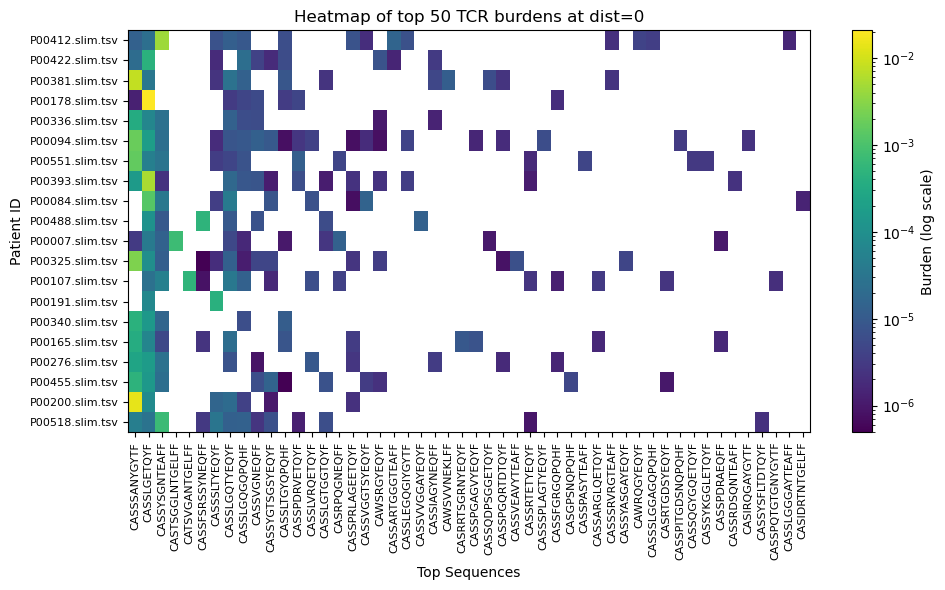

In [44]:
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict
from matplotlib.colors import LogNorm

def plot_burden_heatmap(contributors: dict, top_n_seqs: int = 50):
    """
    Creates a heatmap of the top N most frequent sequences across patients
    representing total burden at distance 0.
    """
    # 1. Aggregate burdens per sequence per patient
    patient_seq_burdens = {}
    all_burdens = []
    for patient_id, dist_dict in contributors.items():
        if 0 not in dist_dict:
            continue
        seq_burden = defaultdict(float)
        for seq, freq in dist_dict[0]:
            seq_burden[seq] += freq
        patient_seq_burdens[patient_id] = seq_burden
        all_burdens.append(seq_burden)
    
    # 2. Identify top N sequences by overall burden
    # Sum across patients
    total_burden = defaultdict(float)
    for seq_burden in all_burdens:
        for seq, burden in seq_burden.items():
            total_burden[seq] += burden
    top_seqs = [seq for seq, _ in sorted(total_burden.items(), key=lambda x: x[1], reverse=True)[:top_n_seqs]]
    
    # 3. Build matrix (patients x sequences)
    patient_ids = list(patient_seq_burdens.keys())
    matrix = np.zeros((len(patient_ids), len(top_seqs)), dtype=float)
    for i, pid in enumerate(patient_ids):
        for j, seq in enumerate(top_seqs):
            matrix[i, j] = patient_seq_burdens[pid].get(seq, 0.0)
    
    # 4. Plot heatmap
    plt.figure(figsize=(max(8, len(top_seqs)*0.2), max(6, len(patient_ids)*0.3)))
    im = plt.imshow(matrix, aspect='auto', cmap='viridis', norm=LogNorm())
    plt.colorbar(im, label='Burden (log scale)')
    plt.xticks(np.arange(len(top_seqs)), top_seqs, rotation=90, fontsize=8)
    plt.yticks(np.arange(len(patient_ids)), patient_ids, fontsize=8)
    plt.xlabel('Top Sequences')
    plt.ylabel('Patient ID')
    plt.title(f'Heatmap of top {top_n_seqs} TCR burdens at dist=0')
    plt.tight_layout()
    plt.show()

# Example usage:
plot_burden_heatmap(contributors, top_n_seqs=50)


### tester - ignore